In [1]:
import os
import json
import random
import numpy as np
import pandas as pd
import pickle
import neptune

from itertools import product
import torch 
from torch import nn 
from torch import optim
import torch.nn.functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from tqdm.autonotebook import tqdm
import itertools
import random
import copy
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
import cv2
import json
from sklearn.model_selection import train_test_split
from functools import partial
from concurrent.futures import ProcessPoolExecutor, ThreadPoolExecutor

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE",
                        "#FFDD00",
                        "#FF7D00",
                        "#FF006D",
                        "#ADFF02",
                        "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))
rcParams['figure.figsize'] = 12, 8


"""
Collection of functions which enable the evaluation of a classifier's performance,
by showing confusion matrix, accuracy, recall, precision etc.
"""

import numpy as np
import sys

import matplotlib.pyplot as plt

from sklearn import metrics
from tabulate import tabulate
import math
import logging
from datetime import datetime
from sklearn.metrics import accuracy_score

def save_history(history, model_name, unique_name, models_saves, config):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH, exist_ok=True)

    with open(f"{PATH}/{unique_name}.json", "w+") as f0:
        json.dump(history, f0)

def get_config(file_loc):
    file = torch.load(file_loc)
    return file["model_state_dict"], file["model_config"], file["config"]
    
def save_model(model, model_name, unique_name, models_saves, config):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH, exist_ok=True)
    torch.save({
        "n_epochs": config["n_epochs"],
        "model_state_dict": model.state_dict(),
        "model_config": config["model"],
        "config": config
    }, f"{PATH}/{unique_name}.pt")

def plot_confusion_matrix(ConfMat, label_strings=None, title='Confusion matrix', cmap=plt.cm.get_cmap('Blues')):
    """Plot confusion matrix in a separate window"""
    plt.imshow(ConfMat, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    if label_strings:
        tick_marks = np.arange(len(label_strings))
        plt.xticks(tick_marks, label_strings, rotation=90)
        plt.yticks(tick_marks, label_strings)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

def generate_classification_report(existing_class_names, precision, recall, f1, support, ConfMatrix_normalized_row, digits=3, number_of_thieves=2, maxcharlength=35):
    """
    Returns a string of a report for given metric arrays (array length equals the number of classes).
    Called internally by `analyze_classification`.
        digits: number of digits after . for displaying results
        number_of_thieves: number of biggest thieves to report
        maxcharlength: max. number of characters to use when displaying thief names
    """

    relative_freq = support / np.sum(support)  # relative frequencies of each class in the true lables
    sorted_class_indices = np.argsort(relative_freq)[
                            ::-1]  # sort by "importance" of classes (i.e. occurance frequency)

    last_line_heading = 'avg / total'

    width = max(len(cn) for cn in existing_class_names)
    width = max(width, len(last_line_heading), digits)

    headers = ["precision", "recall", "f1-score", "rel. freq.", "abs. freq.", "biggest thieves"]
    fmt = '%% %ds' % width  # first column: class name
    fmt += '  '
    fmt += ' '.join(['% 10s' for _ in headers[:-1]])
    fmt += '|\t % 5s'
    fmt += '\n'

    headers = [""] + headers
    report = fmt % tuple(headers)
    report += '\n'

    for i in sorted_class_indices:
        values = [existing_class_names[i]]
        for v in (precision[i], recall[i], f1[i],
                    relative_freq[i]):  # v is NOT a tuple, just goes through this list 1 el. at a time
            values += ["{0:0.{1}f}".format(v, digits)]
        values += ["{}".format(support[i])]
        thieves = np.argsort(ConfMatrix_normalized_row[i, :])[::-1][
                    :number_of_thieves + 1]  # other class indices "stealing" from class. May still contain self
        thieves = thieves[thieves != i]  # exclude self at this point
        steal_ratio = ConfMatrix_normalized_row[i, thieves]
        thieves_names = [
            existing_class_names[thief][:min(maxcharlength, len(existing_class_names[thief]))] for thief
            in thieves]  # a little inefficient but inconsequential
        string_about_stealing = ""
        for j in range(len(thieves)):
            string_about_stealing += "{0}: {1:.3f},\t".format(thieves_names[j], steal_ratio[j])
        values += [string_about_stealing]

        report += fmt % tuple(values)

    report += '\n' + 100 * '-' + '\n'

    # compute averages/sums
    values = [last_line_heading]
    for v in (np.average(precision, weights=relative_freq),
                np.average(recall, weights=relative_freq),
                np.average(f1, weights=relative_freq)):
        values += ["{0:0.{1}f}".format(v, digits)]
    values += ['{0}'.format(np.sum(relative_freq))]
    values += ['{0}'.format(np.sum(support))]
    values += ['']

    # make last ("Total") line for report
    report += fmt % tuple(values)

    return report


def action_evaluator(y_pred, y_true, class_names, excluded_classes=None, maxcharlength=35, print_report=True, show_plot=True):
    """
    For an array of label predictions and the respective true labels, shows confusion matrix, accuracy, recall, precision etc:
    Input:
        y_pred: 1D array of predicted labels (class indices)
        y_true: 1D array of true labels (class indices)
        class_names: 1D array or list of class names in the order of class indices.
            Could also be integers [0, 1, ..., num_classes-1].
        excluded_classes: list of classes to be excluded from average precision, recall calculation (e.g. OTHER)
    """

    # Trim class_names to include only classes existing in y_pred OR y_true
    in_pred_labels = set(list(y_pred))
    in_true_labels = set(list(y_true))
    # print("predicted labels > ", in_pred_labels, "in_true_labels > ", in_true_labels)

    existing_class_ind = sorted(list(in_pred_labels | in_true_labels))
    # print("pred label", in_pred_labels, "true label", in_true_labels)
    class_strings = [str(name) for name in class_names]  # needed in case `class_names` elements are not strings
    existing_class_names = [class_strings[ind][:min(maxcharlength, len(class_strings[ind]))] for ind in existing_class_ind]  # a little inefficient but inconsequential

    # Confusion matrix
    ConfMatrix = metrics.confusion_matrix(y_true, y_pred)

    # Normalize the confusion matrix by row (i.e by the number of samples in each class)
    ConfMatrix_normalized_row = metrics.confusion_matrix(y_true, y_pred, normalize='true') 

    if show_plot:
        plt.figure()
        plot_confusion_matrix(ConfMatrix_normalized_row, label_strings=existing_class_names,
                                title='Confusion matrix normalized by row')
        plt.show(block=False)

    # Analyze results
    total_accuracy = np.trace(ConfMatrix) / len(y_true)
    print('Overall accuracy: {:.3f}\n'.format(total_accuracy))

    # returns metrics for each class, in the same order as existing_class_names
    precision, recall, f1, support = metrics.precision_recall_fscore_support(y_true, y_pred, labels=existing_class_ind, zero_division=0)
    # Print report
    if print_report:
        print(generate_classification_report(existing_class_names, precision, recall, f1, support, ConfMatrix_normalized_row))

    # Calculate average precision and recall
    # prec_avg, rec_avg = get_avg_prec_recall(ConfMatrix, existing_class_names, excluded_classes)
    # if excluded_classes:
    #     print(
    #         "\nAverage PRECISION: {:.2f}\n(using class frequencies as weights, excluding classes with no predictions and predictions in '{}')".format(
    #             prec_avg, ', '.join(excluded_classes)))
    #     print(
    #         "\nAverage RECALL (= ACCURACY): {:.2f}\n(using class frequencies as weights, excluding classes in '{}')".format(
    #             rec_avg, ', '.join(excluded_classes)))

    # Make a histogram with the distribution of classes with respect to precision and recall
    # prec_rec_histogram(precision, recall)

    return {"accuracy": total_accuracy, "precision": precision.mean(), "recall": recall.mean(), "f1": f1.mean()}

C:\Users\User\AppData\Local\Temp\ipykernel_10836\3006532346.py:16: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
C:\Users\User\AppData\Local\Temp\ipykernel_10836\3006532346.py:83: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  def plot_confusion_matrix(ConfMat, label_strings=None, title='Confusion matrix', cmap=plt.cm.get_cmap('Blues')):


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def classname_id(class_name_list):
    id2classname = {k:v for k, v in zip(list(range(len(class_name_list))),class_name_list)}
    classname2id = {v:k for k, v in id2classname.items()}
    return id2classname, classname2id

In [3]:
model_ident = "NTURGB120_skeleton_SGN_DSAG_classifier_emb1d"
unique_iden = "epoch50_emb400_xy"

main_dir = ".."
data_dir = os.path.join("H:\\Academics\\FYP_data")
remove_files = ["H:\\Academics\\FYP_data\\NTU_RGBD120_samples_with_missing_skeletons.txt",
                "H:\\Academics\\FYP_data\\NTU_RGBD_samples_with_missing_skeletons.txt"]

epoch_vids = os.path.join(main_dir,"epoch_vids")
models_saves = os.path.join(main_dir,"model_saves")
embeddings_save = os.path.join(main_dir,"embedding_save")
prototypes_save = os.path.join(main_dir,"prototypes")
test_vids = os.path.join(main_dir,"test_vids")
train_ratio = 0.90
val_ratio = 0.1
batch_size = 256

os.makedirs(epoch_vids,exist_ok=True)
os.makedirs(models_saves,exist_ok=True)
os.makedirs(embeddings_save,exist_ok=True)

with open("H:\\Academics\\FYP_data\\nturgb120_label_map.json","r") as f0:
    full_id2cls = json.load(f0)
    
with open("H:\\Academics\\FYP_data\\sel_cls_list - Single_person.txt","r") as f0:
    class_names = [full_id2cls[x] for x in f0.read().split(" ")]

In [4]:
config = {
    "n_epochs":200,
    "model_name":"BidirectionalLSTM",
    "model":{
        "num_joint":12,
        "seq_len":60,
        "decoder_hidden_size":1024,
        "linear_filters":[128,256,512,1024],
        "embedding_size":400,
        "num_classes":len(class_names),
        "num_layers":1,
        "is_3d":False,
        "bidirectional":True,
        "batch_size":batch_size,
        "active_locations":[10,9,8,4,5,6,16,17,18,12,13,14],
        "dev":device,
        "device":"gpu" if torch.cuda.is_available() else "cpu"
        },
    "lr":1e-4,
    'alpha_target': 0.1
}

config["model"]["encoder_hidden_size"] = config["model"]["embedding_size"]//2
config["model"]["input_size"] = config["model"]["num_joint"]*3 if config["model"]["is_3d"] else config["model"]["num_joint"]*2

id2clsname, clsname2id = classname_id(class_names)

In [5]:
run = neptune.init_run(
    project="FYP-Group22/ICANN-Logs",
    api_token="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiJkNWJjMDdhNC05NWY5LTQwNWQtYTQyNi0zNjNmYmYwZDg3M2YifQ==",
)  # your credentials

run['parameters'] = config

c:\Users\User\miniconda3\envs\fyp\lib\site-packages\neptune\common\warnings.py:62: NeptuneWarning: To avoid unintended consumption of logging hours during interactive sessions, the following monitoring options are disabled unless set to 'True' when initializing the run: 'capture_stdout', 'capture_stderr', and 'capture_hardware_metrics'.
  warnings.warn(


https://app.neptune.ai/FYP-Group22/ICANN-Logs/e/IC-221


c:\Users\User\miniconda3\envs\fyp\lib\site-packages\neptune\common\warnings.py:62: NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'list'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type
  warnings.warn(
c:\Users\User\miniconda3\envs\fyp\lib\site-packages\neptune\common\warnings.py:62: NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'torch.device'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type
  warnings.warn(


In [6]:
config

{'n_epochs': 200,
 'model_name': 'BidirectionalLSTM',
 'model': {'num_joint': 12,
  'seq_len': 60,
  'decoder_hidden_size': 1024,
  'linear_filters': [128, 256, 512, 1024],
  'embedding_size': 400,
  'num_classes': 82,
  'num_layers': 1,
  'is_3d': False,
  'bidirectional': True,
  'batch_size': 256,
  'active_locations': [10, 9, 8, 4, 5, 6, 16, 17, 18, 12, 13, 14],
  'dev': device(type='cuda'),
  'device': 'gpu',
  'encoder_hidden_size': 200,
  'input_size': 24},
 'lr': 0.0001,
 'alpha_target': 0.1}

In [7]:
from dataset.SkeletonData.data import *

with open("H:\\Academics\\FYP_data\\shapes_keys.json","r") as f0:
    id2shapes = json.load(f0)

with open("H:\\Academics\\FYP_data\\id_list.txt","r") as f0:
    id_list = f0.read().strip().split("\n")

files_to_remove = set()
for __f in remove_files:
    with open(__f,"r") as f0:
        for val in f0.read().split("\n"):
            files_to_remove.add(val)

print("Number of Files to remove:= ",len(files_to_remove))

total_files = set([x.split(".")[0] for x in id_list]) - files_to_remove
total_files_loc = set([f"{os.path.join(data_dir,x)}.skeleton" for x in total_files])

#split list
rows = [(full_id2cls[str(int(x.split(".")[0][-3:]))],x) for x in total_files_loc]
info_pd = pd.DataFrame(data=rows,columns=["target","file_loc"])

#select needed classes.
info_pd = info_pd.loc[info_pd["target"].isin(class_names)]
train_df, val_df = train_test_split(info_pd,stratify=info_pd["target"],train_size=train_ratio)

print("Number of Files to Total:= ",len(total_files))

train_builder = SkeletonFileBuilder(file_names=set(train_df["file_loc"].to_list()),ignore_files=remove_files)
val_builder = SkeletonFileBuilder(file_names=set(val_df["file_loc"].to_list()),ignore_files=remove_files)

print("Number of Files to Train:= ",len(train_builder))
print("Number of Files to Val:= ",len(val_builder))

train_file_iterator = iter(train_builder)
val_file_iterator = iter(val_builder)

Number of Files to remove:=  535
Number of Files to Total:=  73600
Number of Files to Train:=  66240
Number of Files to Val:=  7360


In [8]:
def load_file_to_memory(id2shape,save_dict,each_file):
  file_id = each_file.filepath.split(os.path.sep)[-1].split(".")[0]
  #if not os.path.exists(f"{data_dir}/{file_id}.skeleton"):
  #  return None

  num_frame, body_data = each_file.load_data()
  orig_vid_size = id2shape[file_id]
  
  #for frame_data in body_data:
  #  if frame_data["body_count"] != 1:
  #      return None
  
  skel_data = []
  for frame_data in body_data:
      frame_jd = []
      for jd in frame_data["bodies"][0]["joint_details"]:
          x = jd["colorX"] / orig_vid_size[1]
          y = jd["colorY"] / orig_vid_size[0]

          frame_jd.append([x, y])

      skel_data.append(frame_jd)

  skel_data = np.asarray(skel_data)
  save_dict[file_id] = (file_id,orig_vid_size,str(int(file_id[-3:])),skel_data)
  return file_id

class SkeletonDataset(Dataset):
    def __init__(self,
                 data_builder, 
                 fileid2shape,
                 full_label_map,
                 cls2id,
                 data=None,
                 transform=None,
                 seq_len = 100,
                 window_size = 200,
                 target_transform=None,
                 active_locations=[11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28],
                 file_name=False, 
                 is_2d=False):
        self.data_builder = data_builder
        self.data = data
        self.transform = transform
        self.fileid2shape = fileid2shape
        self.window_size = window_size
        self.seq_len = seq_len
        self.target_transform = target_transform
        self.active_locations = active_locations
        self.file_name = file_name
        self.is_2d = is_2d
        self.cls2id = cls2id
        self.full_label_map = full_label_map

        if self.active_locations:
          self.join_translation_map = {k:i for i,k in enumerate(self.active_locations)}
        
        if not self.data:
          self.data = {}
          with ThreadPoolExecutor() as executor:
            self.indexes = list(
                tqdm(
                  executor.map(
                    partial(load_file_to_memory,self.fileid2shape,self.data),
                    self.data_builder), 
                  total=len(self.data_builder),
                  desc="Loaded Files"
                )
            )

          self.full_indexes = [x for x in self.indexes if x != None]
        else:
          self.full_indexes = list(self.data.keys())
          
        self.indexes = random.sample(self.full_indexes,(len(self.full_indexes)//batch_size)*batch_size)
    

    def __len__(self):
        return len(self.indexes)
      
    def select_frames(self,sequence):
      if sequence.shape[0]<self.seq_len:
        times = self.seq_len//sequence.shape[0] + 1

        sequence = sequence.repeat(times,1,1)

      if sequence.shape[0]>self.window_size:
        start = random.randint(0,sequence.shape[0]-self.window_size-1)
        sequence = sequence[start:start+self.window_size,...]
                               
      sel_index = sorted(random.sample(range(sequence.shape[0]),self.seq_len))
        
      return sequence[sel_index,...]
    
    def create_connection_map(self,original_map):
      if not self.active_locations:
        return original_map
      
      all_possible_comb = product(self.active_locations,self.active_locations)
      all_possible_comb = set(all_possible_comb)
      
      original_map = set(original_map)
      sel_connections = list(all_possible_comb.intersection(original_map))
      sel_connections = [(self.join_translation_map[x[0]],self.join_translation_map[x[1]]) for x in sel_connections]
      
      return sel_connections 

    def __getitem__(self, idx):
        idx = self.indexes[idx]
        
        orig_target = self.data[idx][2]
        file_path = self.data[idx][0]
        vid_size = self.data[idx][1]
        coords = self.data[idx][3]
        
        target = self.cls2id[self.full_label_map[orig_target]]
        
        if self.active_locations:
          coords = coords[:,self.active_locations,:]

        if self.is_2d:
            coords = coords[...,0:2]

        coords = torch.from_numpy(coords).float()
        coords = self.select_frames(coords)

        shape = coords.shape
        coords = torch.reshape(coords, (shape[0], shape[1]*shape[2]))
        label = torch.clone(coords)

        if self.transform:
            coords = self.transform(coords)
        if self.target_transform:
            label = self.target_transform(coords)

        coords[torch.isnan(coords)] = 0
        label[torch.isnan(label)] = 0

        if self.file_name:
            return coords, label, target,vid_size,file_path
        return coords, label, target,vid_size

In [9]:
with open("H:\\Academics\\FYP_data\\train_data.pkl","rb") as f0:
  train_data_load = pickle.load(f0)

with open("H:\\Academics\\FYP_data\\val_data.pkl","rb") as f0:
  val_data_load = pickle.load(f0)

In [10]:
train_ds = SkeletonDataset(train_file_iterator,
                             id2shapes,
                             full_id2cls,
                             clsname2id,
                             data=train_data_load,
                             seq_len=config["model"]["seq_len"],
                             file_name=True,
                             is_2d=True,
                             active_locations=[10,9,8,4,5,6,
                                               16,17,18,12,13,14])
val_ds = SkeletonDataset(val_file_iterator,
                           id2shapes,
                           full_id2cls,
                           clsname2id,
                           data=val_data_load,
                           seq_len=config["model"]["seq_len"],
                           file_name=True,
                           is_2d=True,
                           active_locations=[10,9,8,4,5,6,
                                               16,17,18,12,13,14])
#test_data = SkeletonDataset(val_file_iterator,id2shapes,is_2d=True)

In [11]:
len(train_ds.indexes),len(val_ds.indexes)

(66048, 7168)

In [12]:
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
#test_dl = DataLoader(test_data, batch_size=batch_size, shuffle=False)

In [13]:
def gen_skeleton(frame, 
                 height,
                 width,
                 mapping_list = [(0, 1), (1, 3), (3, 5), 
                                 (0, 2), (2, 4), (0, 6), 
                                 (1, 7), (6, 7), (6, 8), 
                                 (7, 9), (8, 10), (9, 11)]):
    img_3 = np.zeros([height, width,3],dtype=np.uint8)
    img_3.fill(255)

    # add circles
    for coord in frame:
        x, y = int(width*coord[0]), int(height*coord[1])
        img_3 = cv2.circle(img_3, center=(x,y), radius=1, color=(255, 0, 0), thickness=6)

    # add lines
    for line in mapping_list:
        i, j = line
        st = frame[i, :]
        start_point = (int(width*st[0]), int(height*st[1]))

        en = frame[j, :]
        end_point = (int(width*en[0]), int(height*en[1]))

        img3_ = cv2.line(img_3, start_point, end_point, color=(0, 0, 0), thickness=3)

    return img_3

def gen_video(points, 
              save_file, 
              frame_h, 
              frame_w, 
              is_3d=True,
              mapping_list = [(0, 1), (1, 3), (3, 5), 
                                 (0, 2), (2, 4), (0, 6), 
                                 (1, 7), (6, 7), (6, 8), 
                                 (7, 9), (8, 10), (9, 11)]):
    # make 3D if points are flatten
    if len(points.shape) == 2:
        if is_3d:
          fts = points.shape[1]
          x_cds = list(range(0, fts, 3))
          y_cds = list(range(1, fts, 3))
          z_cds = list(range(2, fts, 3))
          points = np.transpose(np.array([points[:, x_cds], 
                                          points[:, y_cds], 
                                          points[:, z_cds]]), (1,2,0))
        else:
          fts = points.shape[1]
          x_cds = list(range(0, fts, 2))
          y_cds = list(range(1, fts, 2))
          points = np.transpose(np.array([points[:, x_cds], 
                                          points[:, y_cds]]), (1,2,0))

    size = (frame_w, frame_h)
    result = cv2.VideoWriter(save_file,
                         cv2.VideoWriter_fourcc(*'MJPG'),
                         10, size)

    for __id,frame in enumerate(points):
        skel_image = gen_skeleton(frame, frame_h, frame_w,mapping_list=mapping_list)
        result.write(skel_image)

    result.release()

In [14]:
joint_map = [(3,2),(2,20),(20,4),(4,5),(5,6),(6,7),(7,21),(7,22),(20,8),(8,9),(9,10),(10,11),(11,23),(11,24),
            (20,1),(1,0),(0,12),(12,13),(13,14),(14,15),(0,16),(16,17),(17,18),(18,19),(8,16),(4,12),(8,4),(16,12)]

joint_map = val_ds.create_connection_map(joint_map)

In [15]:
"""
save_vids_dir = "checking_vids/init"
for adata in tqdm(train_dl):
  selected_ind = random.randint(0,adata[0].shape[0]-1)
  data = adata[0][selected_ind].numpy()
  file_id = adata[4][selected_ind].split(".")[0]
  target = id2clsname[int(adata[2][selected_ind])]
  vid_size = [int(adata[3][0][selected_ind]),int(adata[3][1][selected_ind])]

  try:
    if not os.path.exists(f"{save_vids_dir}/{file_id}/dataloader_out_cls_{target}.mp4"):
      os.makedirs(f"{save_vids_dir}/{file_id}",exist_ok=True)
      gen_video(data, 
                f"{save_vids_dir}/{file_id}/dataloader_out_cls_{target}.mp4",
                vid_size[0], 
                vid_size[1],
                is_3d=False,
                mapping_list=joint_map
                )
  except ValueError:
    continue
"""

'\nsave_vids_dir = "checking_vids/init"\nfor adata in tqdm(train_dl):\n  selected_ind = random.randint(0,adata[0].shape[0]-1)\n  data = adata[0][selected_ind].numpy()\n  file_id = adata[4][selected_ind].split(".")[0]\n  target = id2clsname[int(adata[2][selected_ind])]\n  vid_size = [int(adata[3][0][selected_ind]),int(adata[3][1][selected_ind])]\n\n  try:\n    if not os.path.exists(f"{save_vids_dir}/{file_id}/dataloader_out_cls_{target}.mp4"):\n      os.makedirs(f"{save_vids_dir}/{file_id}",exist_ok=True)\n      gen_video(data, \n                f"{save_vids_dir}/{file_id}/dataloader_out_cls_{target}.mp4",\n                vid_size[0], \n                vid_size[1],\n                is_3d=False,\n                mapping_list=joint_map\n                )\n  except ValueError:\n    continue\n'

In [16]:
import torch 
import torch.nn as nn
from torch.nn import functional as F
import numpy as np




class BasicBlock(nn.Module):
    """
    Basic block is composed of 2 CNN layers with residual connection.
    Each CNN layer is followed by batchnorm layer and swish activation 
    function. 
    Args:
        in_channel: number of input channels
        out_channel: number of output channels
        k: (default = 1) kernel size
    """
    def __init__(self, in_channel, out_channel, k=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_channel,
            out_channel,
            kernel_size=k,
            padding=(0, 0),
            stride=(1, 1))
        self.bn1 = nn.BatchNorm2d(out_channel)

        self.conv2 = nn.Conv2d(
            out_channel,
            out_channel,
            kernel_size=1,
            padding=(0, 0),
            stride=(1, 1))
        self.bn2 = nn.BatchNorm2d(out_channel)

        self.shortcut = nn.Sequential()
        # if in_channel != out_channel:
        self.shortcut.add_module(
            'conv',
            nn.Conv2d(
                in_channel,
                out_channel,
                kernel_size=k,
                padding=(0,0),
                stride=(1,1)))
        self.shortcut.add_module('bn', nn.BatchNorm2d(out_channel))

    def swish(self,x):
        """
        We use swish in spatio-temporal encoding/decoding. We tried with 
        other activation functions such as ReLU and LeakyReLU. But we 
        achieved the best performance with swish activation function.
        Args:
            X: tensor: (batch_size, ...)
        Return:
            _: tensor: (batch, ...): applies swish 
            activation to input tensor and returns  
        """
        return x*torch.sigmoid(x)

    def forward(self, x):
        y = self.swish(self.conv1(x))
        y = self.swish(self.conv2(y))
        y = y + self.shortcut(x)
        y = self.swish(y)
        return y


class BasicBlockTranspose(nn.Module):
    """
    Basic block is composed of 2 CNN layers with residual connection.
    Each CNN layer is followed by batchnorm layer and swish activation 
    function. 
    Args:
        in_channel: number of input channels
        out_channel: number of output channels
        k: (default = 1) kernel size
    """
    def __init__(self, in_channel, out_channel, k=(1,1)):
        super(BasicBlockTranspose, self).__init__()
        self.stride = (1, 1)
        self.padding = (0, 0)
        self.k = k
        self.conv1 = nn.ConvTranspose2d(
            in_channel,
            out_channel,
            kernel_size=k,
            padding=self.padding,
            stride=self.stride)
        self.bn1 = nn.BatchNorm2d(out_channel)

        self.conv2 = nn.ConvTranspose2d(
            out_channel,
            out_channel,
            kernel_size=1,
            padding=self.padding,
            stride=self.stride)
        self.bn2 = nn.BatchNorm2d(out_channel)

        self.shortcut = nn.Sequential()
        # if in_channel != out_channel:
        self.shortcut.add_module(
            'conv',
            nn.ConvTranspose2d(
                in_channel,
                out_channel,
                kernel_size=k,
                padding=self.padding,
                stride=self.stride))
        self.shortcut.add_module('bn', nn.BatchNorm2d(out_channel))

    def get_h_out(self,h_in):
        return (h_in - 1)*self.stride[0]-2*self.padding[0]+(self.k[0]-1)+1
    def get_w_out(self,w_in):
        return (w_in - 1)*self.stride[1]-2*self.padding[1]+(self.k[1]-1)+1

    def swish(self,x):
        """
        We use swish in spatio-temporal encoding/decoding. We tried with 
        other activation functions such as ReLU and LeakyReLU. But we 
        achieved the best performance with swish activation function.
        Args:
            X: tensor: (batch_size, ...)
        Return:
            _: tensor: (batch, ...): applies swish 
            activation to input tensor and returns  
        """
        return x*torch.sigmoid(x)

    def forward(self, x):
        y = self.swish(self.bn1(self.conv1(x)))
        y = self.swish(self.bn2(self.conv2(y)))
        y = y + self.shortcut(x)
        y = self.swish(y)
        return y



class Self_Attn_Seq(nn.Module):
    def __init__(self,in_dim, n_head=3):
        super(Self_Attn_Seq,self).__init__()
        input_dim = in_dim
        self.n_head = n_head # number of attenn head
        self.hidden_size_attention = input_dim // self.n_head
        self.w_q = nn.Linear(input_dim, self.n_head * self.hidden_size_attention)
        self.w_k = nn.Linear(input_dim, self.n_head * self.hidden_size_attention)
        self.w_v = nn.Linear(input_dim, self.n_head * self.hidden_size_attention)
        nn.init.normal_(self.w_q.weight, mean=0, std=np.sqrt(2.0 / (input_dim + self.hidden_size_attention)))
        nn.init.normal_(self.w_k.weight, mean=0,
                        std=np.sqrt(2.0 / (input_dim + self.hidden_size_attention)))
        nn.init.normal_(self.w_v.weight, mean=0,
                        std=np.sqrt(2.0 / (input_dim + self.hidden_size_attention)))
        self.temperature = np.power(self.hidden_size_attention, 0.5)

        self.softmax = nn.Softmax(dim=2)
        self.linear2 = nn.Linear(self.n_head * self.hidden_size_attention, input_dim)
        self.layer_norm = nn.LayerNorm(input_dim)
        self.gamma = nn.Parameter(torch.zeros(1))
    

    def forward(self, q):
        n_head = self.n_head
        residual = q
        k, v = q, q
        bs, len, _ = q.size()
        q = self.w_q(q).view(bs, len, n_head, self.hidden_size_attention)
        k = self.w_k(k).view(bs, len, n_head, self.hidden_size_attention)
        v = self.w_v(v).view(bs, len, n_head, self.hidden_size_attention)

        q = q.permute(2, 0, 1, 3).contiguous().view(-1, len, self.hidden_size_attention)
        k = k.permute(2, 0, 1, 3).contiguous().view(-1, len, self.hidden_size_attention)
        v = v.permute(2, 0, 1, 3).contiguous().view(-1, len, self.hidden_size_attention)

        # generate mask
        subsequent_mask = torch.triu(
            torch.ones((len, len), device=q.device, dtype=torch.uint8), diagonal=1)
        subsequent_mask = subsequent_mask.unsqueeze(0).expand(bs, -1, -1).gt(0)
        mask = subsequent_mask.repeat(n_head, 1, 1)

        # self attention
        attn = torch.bmm(q, k.transpose(1, 2)) / self.temperature
        attn = attn.masked_fill(mask, -np.inf)
        attn = self.softmax(attn)

        output = torch.bmm(attn, v)
        output = output.view(n_head, bs, len, self.hidden_size_attention)
        output = output.permute(1, 2, 0, 3).contiguous().view(bs, len, -1)
        output = self.gamma * self.linear2(output) + residual


        attn = attn.view(n_head,bs,len,len)
        attn_avg = torch.mean(attn,0)
        return output, attn_avg





class DSAGGenerator(nn.Module):
    def __init__(self,  
                 seq_len, 
                 input_size, 
                 embedding_size:int,
                 temporal_decoder_filters=[4,8,14,16],
                 feat_size = [2,4],
                 internal_attention = [168]
                 ):
        super(DSAGGenerator, self).__init__()
        self.embedding_size = embedding_size

        temporal_decoder_filters.append(seq_len-2)
        self.temporal_decoder_filters = temporal_decoder_filters

        self.latent_dim_inner = self.embedding_size//self.temporal_decoder_filters[0]

        self.input_size = input_size
        self.internal_attention = internal_attention
        self.feat_sizes = feat_size
        self.seq_len = seq_len

        #transpose blocks
        self.decode_s1 = BasicBlockTranspose(self.latent_dim_inner//self.feat_sizes[0], self.latent_dim_inner//self.feat_sizes[0], k=(3,1))
        self.decode_s2 = BasicBlockTranspose(self.internal_attention[0]//self.feat_sizes[1], self.internal_attention[0]//self.feat_sizes[1], k=(3,1))

        # decoder 
        self.conv1 = BasicBlock(1,1)
        self.conv2 = BasicBlock(1,1)
        self.conv3 = BasicBlock(1,1)
        self.conv4 = BasicBlock(1,1)
        self.decode_t = BasicBlock(self.temporal_decoder_filters[0],self.temporal_decoder_filters[1])
        self.decode_t1 = BasicBlock(self.temporal_decoder_filters[1],self.temporal_decoder_filters[2])
        self.decode_t2 = BasicBlock(self.decode_s1.get_h_out(self.temporal_decoder_filters[2]),
                                    self.temporal_decoder_filters[3])
        self.decode_t3 = BasicBlock(self.temporal_decoder_filters[3],self.temporal_decoder_filters[4])
        self.decode_t4 = BasicBlock(self.decode_s2.get_h_out(self.temporal_decoder_filters[4]),
                                    self.seq_len)

        # self attention layer
        self.decoder_attn1 = Self_Attn_Seq(self.latent_dim_inner)
        self.decoder_attn2 = Self_Attn_Seq(self.internal_attention[0])
        self.decoder = nn.Linear(self.latent_dim_inner, self.internal_attention[0])
        self.decoder1 = nn.Linear(self.internal_attention[0],self.input_size)

        
        # self.decode_s3 = BasicBlockTranspose(22, 22, k=(3,1))



    def forward(self, X):
        """0
        The deocder is opposit of the encoder. It takes the vector sampled
        from a mixture of gaussian parameter conditioned by class label on-
        hot vector and viewpoint vector, upsamples it in the temporal dimension 
        first and then upsamples it in the spatial dimension.
        Args:
            X: tensor: (batch_size, 4, ...): sampled vector conditionied on class 
            label and viewpoint
        Return:
            x: tensor: (batch_size, 32, 48, 6): generated human motion
        """

        N = X.shape[0]
        X = X.reshape((N,self.temporal_decoder_filters[0],-1))
        N,T,J = X.shape
        x, attn = self.decoder_attn1(X)

        # temporal decoding
        x = x.reshape((N,T,J//self.feat_sizes[0],self.feat_sizes[0]))
        x = self.decode_t(x)
        x = self.decode_t1(x)

        # ----------------------------------------------------------------
        # ------------------------- newly added --------------------------
        # ----------------------------------------------------------------

        x = x.transpose(2,1)
        x = self.decode_s1(x)
        x = x.transpose(2,1)

        # ----------------------------------------------------------------
        # pose decoding
        x = x.reshape((N*self.decode_s1.get_h_out(self.temporal_decoder_filters[2]),1,J//self.feat_sizes[0],self.feat_sizes[0]))
        x = self.conv1(x)
        x = x.reshape((N,self.decode_s1.get_h_out(self.temporal_decoder_filters[2]), -1))

        x = self.decoder(x)
        x, attn = self.decoder_attn2(x)
        # ------------------------ End of block one ---------------------

        
        N,T,J = x.shape
        # temporal decoding
        x = x.reshape((N,T,J//self.feat_sizes[1], self.feat_sizes[1]))
        x = self.decode_t2(x)
        x = self.decode_t3(x)

        # ----------------------------------------------------------------
        # ------------------------- Transpose block --------------------------
        # ----------------------------------------------------------------

        x = x.transpose(2,1)
        x = self.decode_s2(x)
        x = x.transpose(2,1)

        # ----------------------------------------------------------------
        # pose decoding
        x = x.reshape((N*self.seq_len,1,J//self.feat_sizes[1],self.feat_sizes[1]))
        x = self.conv2(x)
        x = x.reshape((N,self.seq_len, -1))
        x = self.decoder1(x)
        # ------------------------ End of block two ---------------------

        return x

class norm_data(nn.Module):
    def __init__(self, dim=3, joints=20):
        super(norm_data, self).__init__()

        self.bn = nn.BatchNorm1d(dim*joints)

    def forward(self, x):
        bs, c, num_joints, step = x.size()
        x = x.view(bs, -1, step)
        x = self.bn(x)
        x = x.view(bs, -1, num_joints, step).contiguous()
        return x

class embed(nn.Module):
    def __init__(self, dim=3, joint=20, hidden_dim=128, norm=True, bias=False):
        super(embed, self).__init__()

        if norm:
            self.cnn = nn.Sequential(
                norm_data(dim, joint),
                cnn1x1(dim, 64, bias=bias),
                nn.ReLU(),
                cnn1x1(64, hidden_dim, bias=bias),
                nn.ReLU(),
            )
        else:
            self.cnn = nn.Sequential(
                cnn1x1(dim, 64, bias=bias),
                nn.ReLU(),
                cnn1x1(64, hidden_dim, bias=bias),
                nn.ReLU(),
            )

    def forward(self, x):
        x = self.cnn(x)
        return x

class cnn1x1(nn.Module):
    def __init__(self, dim1 = 3, dim2 =3, bias = True):
        super(cnn1x1, self).__init__()
        self.cnn = nn.Conv2d(dim1, dim2, kernel_size=1, bias=bias)

    def forward(self, x):
        x = self.cnn(x)
        return x

class local(nn.Module):
    def __init__(self, dim1 = 3, dim2 = 3, bias = False):
        super(local, self).__init__()
        self.maxpool = nn.AdaptiveMaxPool2d((1, None))
        self.cnn1 = nn.Conv2d(dim1, dim1, kernel_size=(1, 3), padding=(0, 1), bias=bias)
        self.bn1 = nn.BatchNorm2d(dim1)
        self.relu = nn.ReLU()
        self.cnn2 = nn.Conv2d(dim1, dim2, kernel_size=1, bias=bias)
        self.bn2 = nn.BatchNorm2d(dim2)
        self.dropout = nn.Dropout2d(0.2)

    def forward(self, x1):
        x1 = self.maxpool(x1)
        x = self.cnn1(x1)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.cnn2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

class gcn_spa(nn.Module):
    def __init__(self, in_feature, out_feature, bias = False):
        super(gcn_spa, self).__init__()
        self.bn = nn.BatchNorm2d(out_feature)
        self.relu = nn.ReLU()
        self.w = cnn1x1(in_feature, out_feature, bias=False)
        self.w1 = cnn1x1(in_feature, out_feature, bias=bias)


    def forward(self, x1, g):
        x = x1.permute(0, 3, 2, 1).contiguous()
        x = g.matmul(x)
        x = x.permute(0, 3, 2, 1).contiguous()
        x = self.w(x) + self.w1(x1)
        x = self.relu(self.bn(x))
        return x

class compute_g_spa(nn.Module):
    def __init__(self, dim1 = 64 *3, dim2 = 64*3, bias = False):
        super(compute_g_spa, self).__init__()
        self.dim1 = dim1
        self.dim2 = dim2
        self.g1 = cnn1x1(self.dim1, self.dim2, bias=bias)
        self.g2 = cnn1x1(self.dim1, self.dim2, bias=bias)
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x1):

        g1 = self.g1(x1).permute(0, 3, 2, 1).contiguous()
        g2 = self.g2(x1).permute(0, 3, 1, 2).contiguous()
        g3 = g1.matmul(g2)
        g = self.softmax(g3)
        return g
    

class SGN(nn.Module):
    def __init__(self, num_joint, seg, hidden_size=128, bs=32, is_3d=True, train=True, bias=True, device='cpu'):
        super(SGN, self).__init__()

        self.dim1 = hidden_size
        self.dim_unit = hidden_size // 4 
        self.seg = seg
        self.num_joint = num_joint
        self.bs = bs

        if is_3d:
          self.spatial_dim = 3
        else:
          self.spatial_dim = 2

        if train:
            self.spa = self.one_hot(bs, num_joint, self.seg)
            self.spa = self.spa.permute(0, 3, 2, 1).to(device)
            self.tem = self.one_hot(bs, self.seg, num_joint)
            self.tem = self.tem.permute(0, 3, 1, 2).to(device)
        else:
            self.spa = self.one_hot(32 * 5, num_joint, self.seg)
            self.spa = self.spa.permute(0, 3, 2, 1).to(device)
            self.tem = self.one_hot(32 * 5, self.seg, num_joint)
            self.tem = self.tem.permute(0, 3, 1, 2).to(device)

        self.tem_embed = embed(self.seg, joint=self.num_joint, hidden_dim=self.dim_unit*4, norm=False, bias=bias)
        self.spa_embed = embed(num_joint, joint=self.num_joint, hidden_dim=self.dim_unit, norm=False, bias=bias)
        self.joint_embed = embed(self.spatial_dim, joint=self.num_joint, hidden_dim=self.dim_unit, norm=True, bias=bias)
        self.dif_embed = embed(self.spatial_dim, joint=self.num_joint, hidden_dim=self.dim_unit, norm=True, bias=bias)
        self.maxpool = nn.AdaptiveMaxPool2d([1, 1])
        self.cnn = local(self.dim1, self.dim1 * 2, bias=bias)
        self.compute_g1 = compute_g_spa(self.dim1 // 2, self.dim1, bias=bias)
        self.gcn1 = gcn_spa(self.dim1 // 2, self.dim1 // 2, bias=bias)
        self.gcn2 = gcn_spa(self.dim1 // 2, self.dim1, bias=bias)
        self.gcn3 = gcn_spa(self.dim1, self.dim1, bias=bias)
        
        self.embed_maxpool = nn.AdaptiveMaxPool2d([self.dim1, 2])


        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))

        nn.init.constant_(self.gcn1.w.cnn.weight, 0)
        nn.init.constant_(self.gcn2.w.cnn.weight, 0)
        nn.init.constant_(self.gcn3.w.cnn.weight, 0)


    def forward(self, input):
        
        # Dynamic Representation
        input = input.view((self.bs, self.seg, self.num_joint, self.spatial_dim))
        input = input.permute(0, 3, 2, 1).contiguous()
        dif = input[:, :, :, 1:] - input[:, :, :, 0:-1]
        dif = torch.cat([dif.new(self.bs, dif.size(1), self.num_joint, 1).zero_(), dif], dim=-1)
        # print(input.shape)
        pos = self.joint_embed(input)
        tem1 = self.tem_embed(self.tem)
        spa1 = self.spa_embed(self.spa)
        dif = self.dif_embed(dif)
        dy = pos + dif
        # Joint-level Module
        input= torch.cat([dy, spa1], 1)
        g = self.compute_g1(input)
        input = self.gcn1(input, g)
        input = self.gcn2(input, g)
        input = self.gcn3(input, g)
        # Frame-level Module
        input = input + tem1
        input = self.cnn(input)
        output_feat = torch.squeeze(input)
        output_feat = self.embed_maxpool(output_feat)
        output_feat = torch.flatten(output_feat, 1)

        return output_feat

    def one_hot(self, bs, spa, tem):

        y = torch.arange(spa).unsqueeze(-1)
        y_onehot = torch.FloatTensor(spa, spa)

        y_onehot.zero_()
        y_onehot.scatter_(1, y, 1)

        y_onehot = y_onehot.unsqueeze(0).unsqueeze(0)
        y_onehot = y_onehot.repeat(bs, tem, 1, 1)

        return y_onehot

class SGNClassifier(nn.Module):
  def __init__(self,num_classes,embedding_size, *args, **kwargs) -> None:
      super().__init__(*args, **kwargs)
      self.num_classes = num_classes
      self.embedding_size = embedding_size
      self.fc = nn.Linear(self.embedding_size, self.num_classes)

  def forward(self, input):
      output = self.fc(input)
      return output
    


class EncDecModel(nn.Module):
    def __init__(self,encoder,decoder,classifier):
        super(EncDecModel, self).__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        self.classifier = classifier
        
    def forward(self,x):
        embedding = self.encoder(x)
        classifier_out = self.classifier(embedding)
        decoder_out = self.decoder(embedding)
        
        return decoder_out, embedding, classifier_out
        

In [17]:
encoder = SGN( 
    num_joint=config["model"]["num_joint"], 
    seg=config["model"]["seq_len"], 
    hidden_size=config["model"]["encoder_hidden_size"], 
    bs=batch_size, 
    is_3d=config["model"]["is_3d"],
    device = device,
    train=True).to(device)

classifier = SGNClassifier(
    num_classes=len(class_names),
    embedding_size=config["model"]["embedding_size"],
).to(device)

decoder = DSAGGenerator(
    seq_len = config["model"]["seq_len"], 
    input_size = config["model"]["input_size"], 
    embedding_size=config["model"]["embedding_size"]
).to(device)

bilstm_model = EncDecModel(
    encoder = encoder,
    decoder = decoder,
    classifier = classifier
).to(device)

In [18]:
bilstm_model.to(device);

In [19]:
label_map = [(k,v) for k,v in id2clsname.items()]
labelToId = {x[0]: i for i, x in enumerate(label_map)}

In [20]:
def combined_loss(pred_sequence,pred_label,true_sequence,true_label,loss_module,alpha_target=1,alpha_recon=1):
    recon_loss = alpha_recon*loss_module["reconstruction_loss"](pred_sequence,true_sequence)
    tar_loss = alpha_target*loss_module["target_loss"](pred_label,true_label)
    loss =  recon_loss + tar_loss

    #print(alpha_recon*loss_module["reconstruction_loss"](pred_sequence,true_sequence))
    #print(alpha_target*loss_module["target_loss"](pred_label,true_label))

    return loss, {
        "reconstruction_loss":recon_loss.item(),
        "target_loss":tar_loss.item()
    }



In [21]:
optimizer = torch.optim.Adam(bilstm_model.parameters(), lr=config["lr"], weight_decay=0.01)
std_loss = {
    "reconstruction_loss" :nn.L1Loss(),
    "target_loss" :nn.CrossEntropyLoss()
}

In [22]:
def plot_curves(df):
    df['loss'] = df['loss']/df['samples']
    df['feat. loss'] = df['feat. loss']/df['samples']
    df['classi. loss'] = df['classi. loss']/df['samples']
    
    fig, axs = plt.subplots(nrows=4)
    sns.lineplot(data=df, x='epoch', y='loss', hue='phase', marker='o', ax=axs[2]).set(title="Loss")
    sns.lineplot(data=df, x='epoch', y='feat. loss', hue='phase', marker='o', ax=axs[0]).set(title="Feature Loss")
    sns.lineplot(data=df, x='epoch', y='classi. loss', hue='phase', marker='o', ax=axs[1]).set(title="Classification Loss")
    sns.lineplot(data=df, x='epoch', y='accuracy', hue='phase', marker='o', ax=axs[3]).set(title="Accuracy")

In [23]:
def train_step(model, dataloader, optimizer, loss_module, device, class_names):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    targets = []
    predicts = []

    with tqdm(dataloader, unit="batch", desc="train") as tepoch:
          for input_sequence,target_sequence,target_action,target_vid_size, _ in tepoch:
            input_sequence = input_sequence.to(device)
            target_sequence = target_sequence.to(device)
            target_action = target_action.to(device)
            

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward track history if only in train
            with torch.set_grad_enabled(True):
            # with autocast():
              predicted_sequence, _, predicted_label  = model(input_sequence)
            
            # loss,loss_detail = combined_loss(predicted_sequence,predicted_label, target_sequence, target_action,std_loss)
            recon_loss = loss_module["reconstruction_loss"](predicted_sequence,target_sequence)
            tar_loss = loss_module["target_loss"](predicted_label,target_action)
            loss =  (1-config['alpha_target'])*recon_loss + config['alpha_target']*tar_loss
            loss_detail = {"reconstruction_loss":recon_loss.item(),"target_loss":tar_loss.item()}

            class_output = torch.argmax(predicted_label,dim=1)

            loss.backward()
            optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(target_action)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=target_action.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

            targets.append(target_action.cpu().detach().numpy())
            predicts.append(pred_class)

    
    predicts = np.concatenate(predicts)
    targets = np.concatenate(targets)
    #train_metrics = action_evaluator(predicts,targets,class_names=list(clsname2id.keys()),print_report=False)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [24]:
def eval_step(model, dataloader,loss_module, device, class_names,  print_report=False, show_plot=False):
    model = model.eval()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'targets': [], 'predictions': [], 'metrics': []}
    metrics = {"samples": 0, "loss": 0, "feat. loss": 0, "classi. loss": 0}

    with torch.no_grad():
      with tqdm(dataloader, unit="batch", desc="eval") as tepoch:
        for input_sequence,target_sequence,target_action,target_vid_size,_ in tepoch:

            input_sequence = input_sequence.to(device)
            target_sequence = target_sequence.to(device)
            target_action = target_action.to(device)

            # forward track history if only in train
            with torch.set_grad_enabled(False):
            # with autocast():
                predicted_sequence,_,predicted_label  = model(input_sequence)
            # loss,loss_detail = combined_loss(predicted_sequence,predicted_label, target_sequence, target_action,std_loss)
            recon_loss = loss_module["reconstruction_loss"](predicted_sequence,target_sequence)
            tar_loss = loss_module["target_loss"](predicted_label,target_action)
            loss =  (1-config['alpha_target'])*recon_loss + config['alpha_target']*tar_loss
            loss_detail = {"reconstruction_loss":recon_loss.item(),"target_loss":tar_loss.item()}
            
            pred_action = torch.argmax(predicted_label,dim=1)

            with torch.no_grad():
                metrics['samples'] += len(target_action)
                metrics['loss'] += loss.item()  # add total loss of batch
                metrics['feat. loss'] += loss_detail["reconstruction_loss"]
                metrics['classi. loss'] += loss_detail["target_loss"]

            per_batch['targets'].append(target_action.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets, class_names=class_names, print_report=print_report, show_plot=show_plot)
    metrics_dict.update(metrics)
    return metrics_dict

In [25]:
def log(fold, phase, metrics):
    for m, v in metrics.items():
        if fold == 'global':
            run[f'global/{m}'].log(v)
        else:
            run[f"Fold-{fold}/{phase}/{m}"].log(v)

In [26]:
start_epoch = 0
#model_params, model_config, config = get_config(f"/content/drive/MyDrive/22_FYP42 - Zero-shot Explainable HAR/Devin/SkeletonAE/model_saves/temp_{model_ident}/{start_epoch}__{unique_iden}.pt")
#bilstm_model.load_state_dict(model_params)

Training Epoch:   0%|          | 0/200 [00:00<?, ?it/s]

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.079



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.120



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.177



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.256



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.318



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.366



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.407



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.434



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.454



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

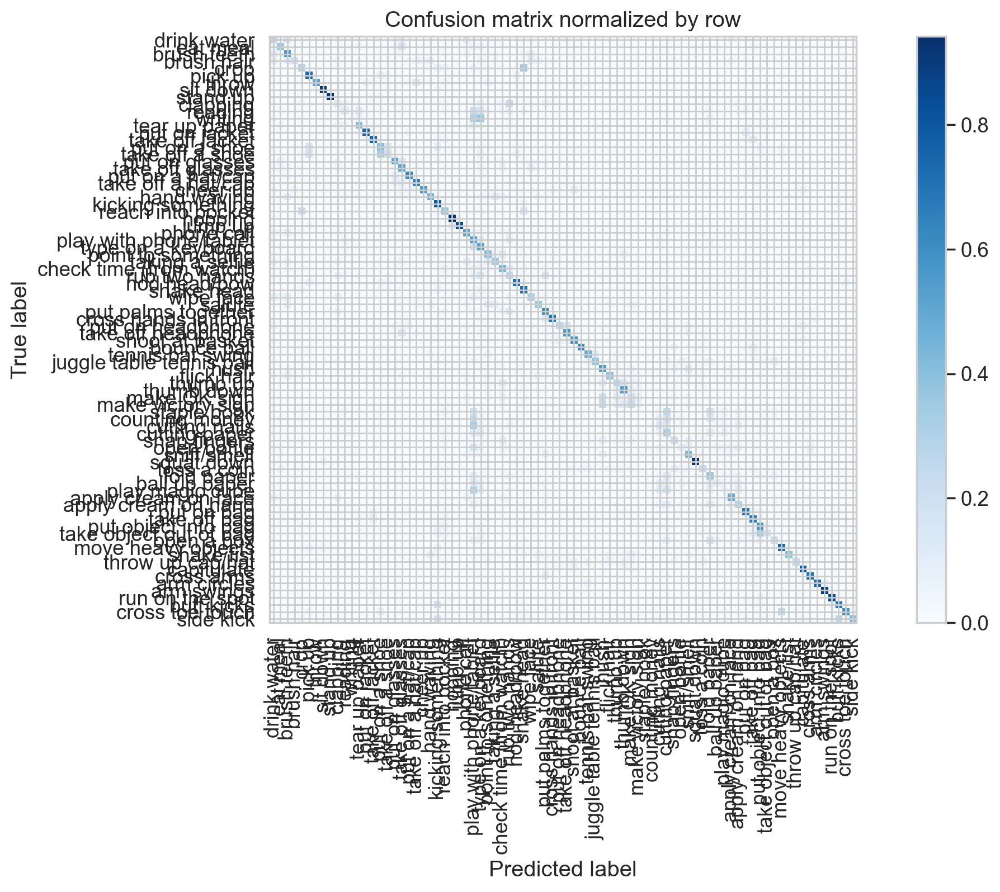

Overall accuracy: 0.464

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.171      0.516      0.257      0.013         93|	 play with phone/tablet: 0.194,	reading: 0.032,	
       reach into pocket       0.333      0.366      0.349      0.013         93|	 drop: 0.215,	shake head: 0.151,	
           put on a shoe       0.378      0.402      0.389      0.013         92|	 pick up: 0.152,	take off a shoe: 0.152,	
              cross arms       0.537      0.717      0.614      0.013         92|	 put palms together: 0.109,	sniff/smell: 0.022,	
          put on glasses       0.541      0.505      0.523      0.013         91|	 take off glasses: 0.154,	eat meal: 0.066,	
           ball up paper       0.360      0.099      0.155      0.013         91|	 play with phone/tablet: 0.132,	fold paper: 0.110,	cutting paper: 0.099,	
       kicking something       0.453      0.791      0.576      0.013         91|	 shake he

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.491



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.494



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.507



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.509



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.522



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.530



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.529



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.538



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.538



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

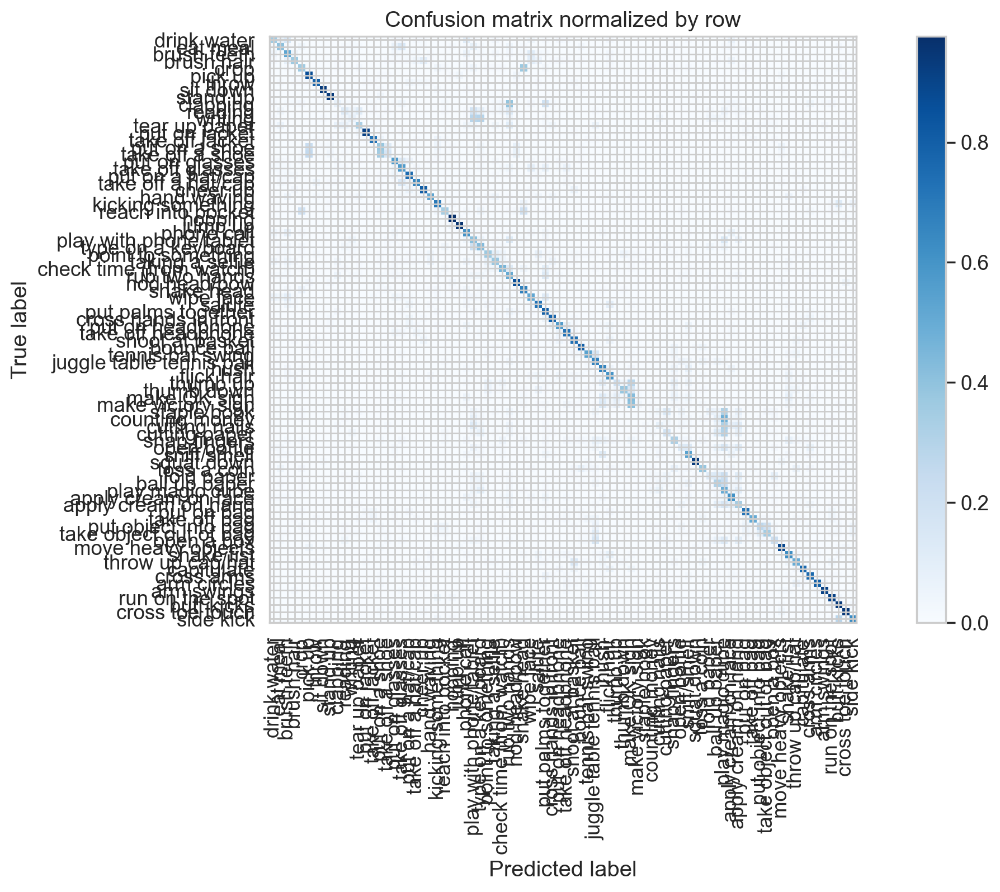

Overall accuracy: 0.537

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.274      0.430      0.335      0.013         93|	 play with phone/tablet: 0.204,	play magic cube: 0.043,	
       reach into pocket       0.627      0.344      0.444      0.013         93|	 shake head: 0.194,	drop: 0.194,	
           put on a shoe       0.372      0.380      0.376      0.013         92|	 pick up: 0.228,	take off a shoe: 0.120,	
              cross arms       0.654      0.761      0.704      0.013         92|	 put palms together: 0.054,	rub two hands: 0.022,	
          put on glasses       0.531      0.571      0.550      0.013         91|	 take off glasses: 0.132,	put on a hat/cap: 0.055,	
           ball up paper       0.248      0.308      0.275      0.013         91|	 play magic cube: 0.242,	sniff/smell: 0.055,	
       kicking something       0.630      0.692      0.660      0.013         91|	 butt kicks: 0.121,

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.533



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.553



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.539



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.544



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.540



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.533



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.543



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.532



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.546



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

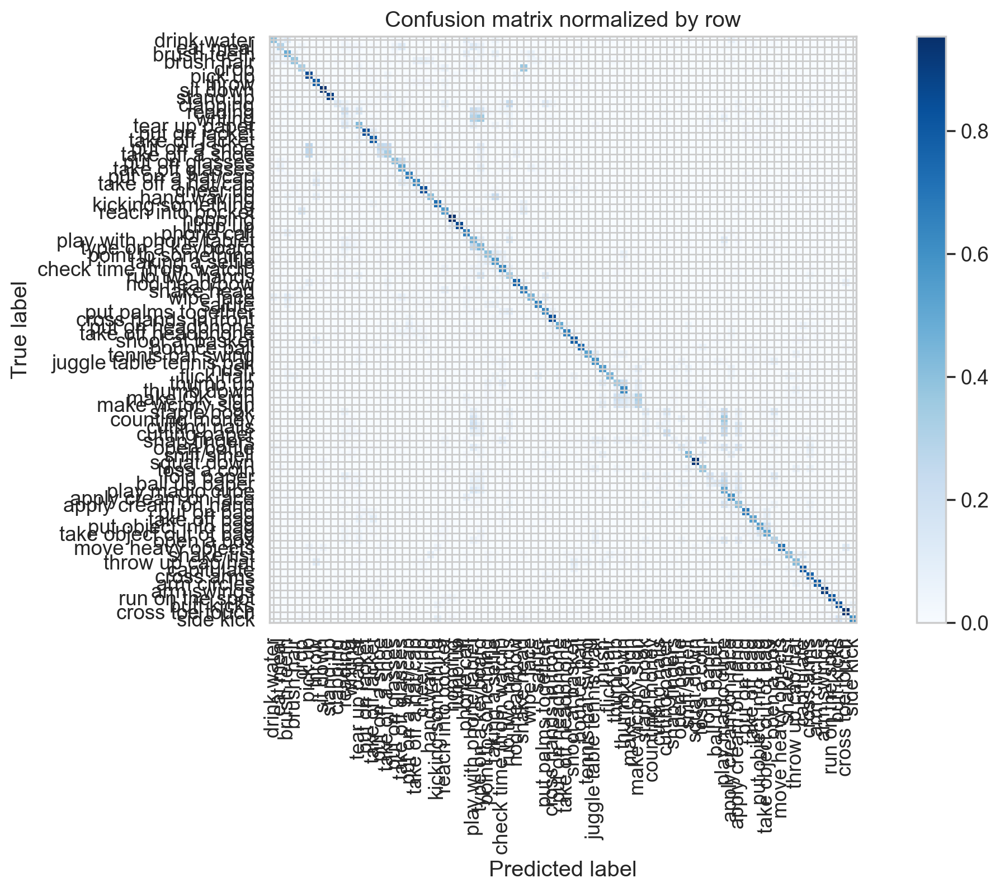

Overall accuracy: 0.526

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.172      0.441      0.247      0.013         93|	 play with phone/tablet: 0.247,	reading: 0.075,	
       reach into pocket       0.405      0.548      0.466      0.013         93|	 drop: 0.140,	shake head: 0.097,	
           put on a shoe       0.426      0.250      0.315      0.013         92|	 pick up: 0.261,	take off a shoe: 0.239,	
              cross arms       0.556      0.761      0.642      0.013         92|	 put palms together: 0.033,	apply cream on face: 0.033,	
          put on glasses       0.590      0.396      0.474      0.013         91|	 take off glasses: 0.231,	eat meal: 0.044,	
           ball up paper       0.476      0.110      0.179      0.013         91|	 play magic cube: 0.253,	apply cream on hand: 0.099,	
       kicking something       0.702      0.725      0.714      0.013         91|	 shake head: 0.066,	t

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.529



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.520



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.513



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.512



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.507



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.511



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.508



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.508



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.499



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

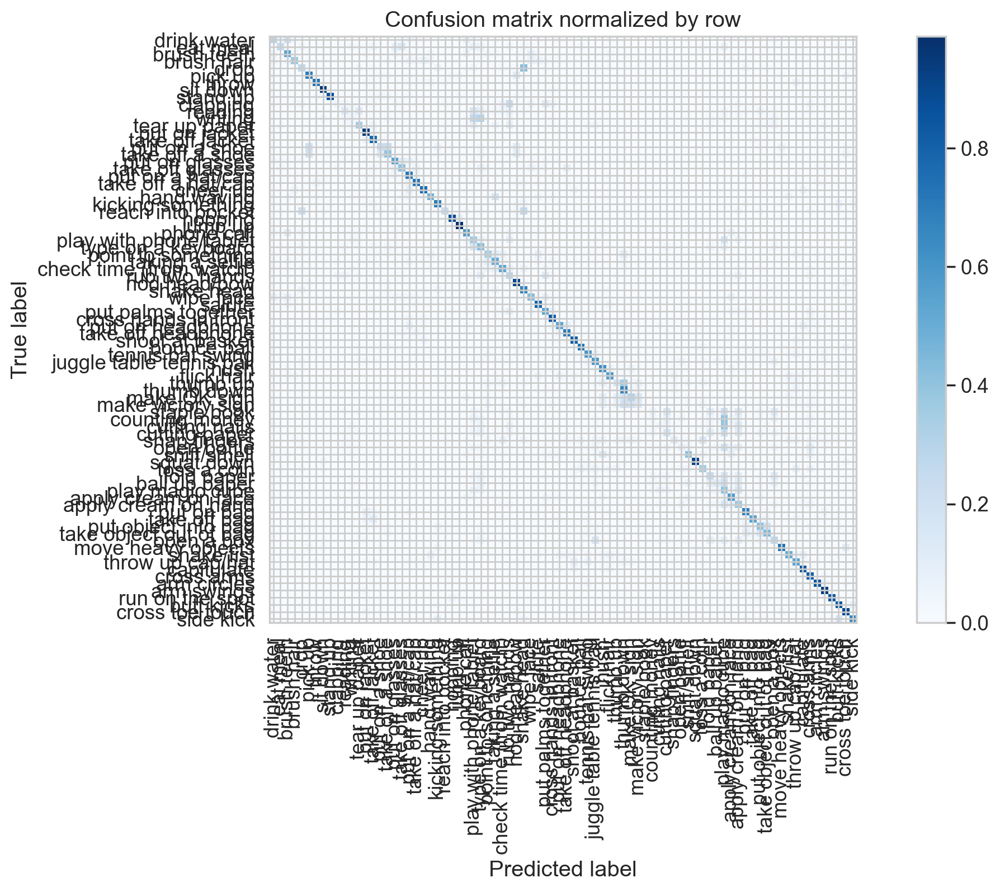

Overall accuracy: 0.516

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.209      0.419      0.279      0.013         93|	 play with phone/tablet: 0.161,	play magic cube: 0.065,	
       reach into pocket       0.595      0.237      0.338      0.013         93|	 shake head: 0.247,	drop: 0.215,	
           put on a shoe       0.468      0.239      0.317      0.013         92|	 take off a shoe: 0.239,	pick up: 0.207,	
              cross arms       0.497      0.804      0.614      0.013         92|	 put palms together: 0.022,	arm swings: 0.022,	
          put on glasses       0.551      0.538      0.544      0.013         91|	 take off glasses: 0.110,	put on a hat/cap: 0.066,	
           ball up paper       0.282      0.121      0.169      0.013         91|	 play magic cube: 0.220,	apply cream on hand: 0.121,	
       kicking something       0.663      0.692      0.677      0.013         91|	 butt kicks: 0

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.511



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.503



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.510



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.491



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.499



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.484



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.487



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.489



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.487



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

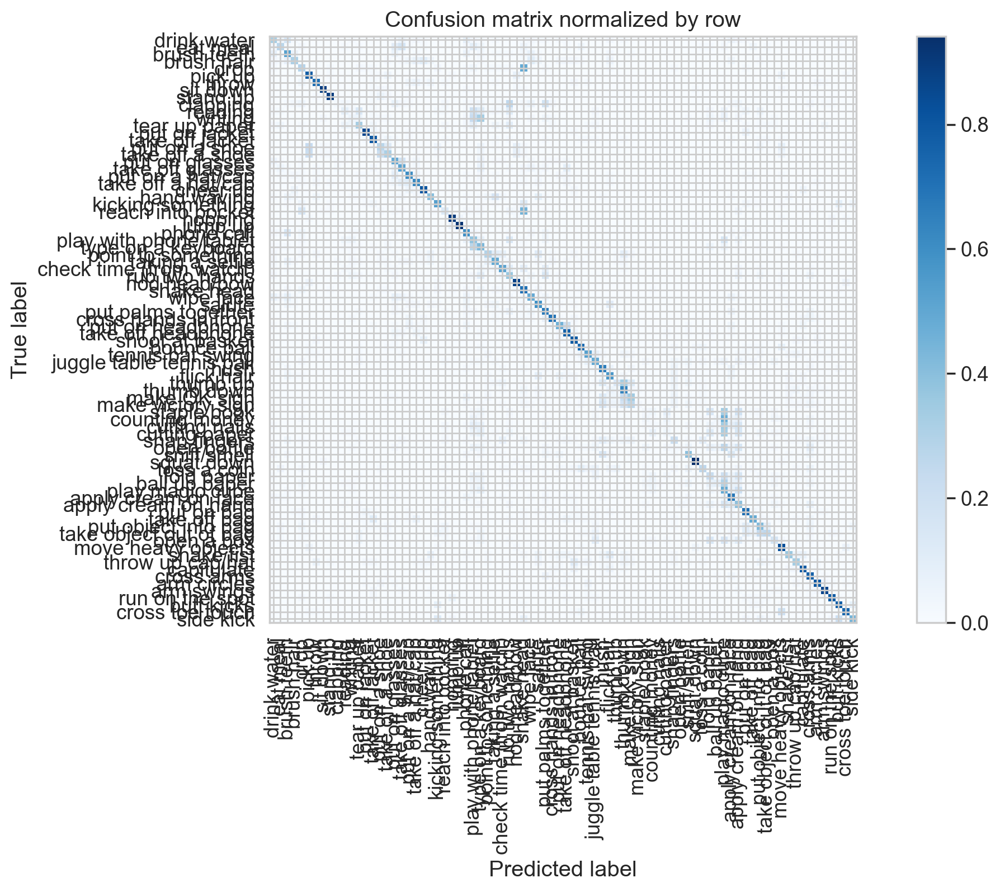

Overall accuracy: 0.487

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.203      0.430      0.276      0.013         93|	 play with phone/tablet: 0.269,	fold paper: 0.043,	
       reach into pocket       0.279      0.129      0.176      0.013         93|	 shake head: 0.452,	drop: 0.151,	
           put on a shoe       0.379      0.272      0.316      0.013         92|	 pick up: 0.228,	take off a shoe: 0.120,	
              cross arms       0.493      0.761      0.598      0.013         92|	 put palms together: 0.054,	apply cream on face: 0.033,	
          put on glasses       0.389      0.484      0.431      0.013         91|	 take off glasses: 0.176,	type on a keyboard: 0.055,	
           ball up paper       0.286      0.088      0.134      0.013         91|	 play magic cube: 0.297,	apply cream on hand: 0.077,	
       kicking something       0.565      0.527      0.545      0.013         91|	 shake h

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.484



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.467



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.487



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.488



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.488



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.488



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.494



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.480



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.477



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

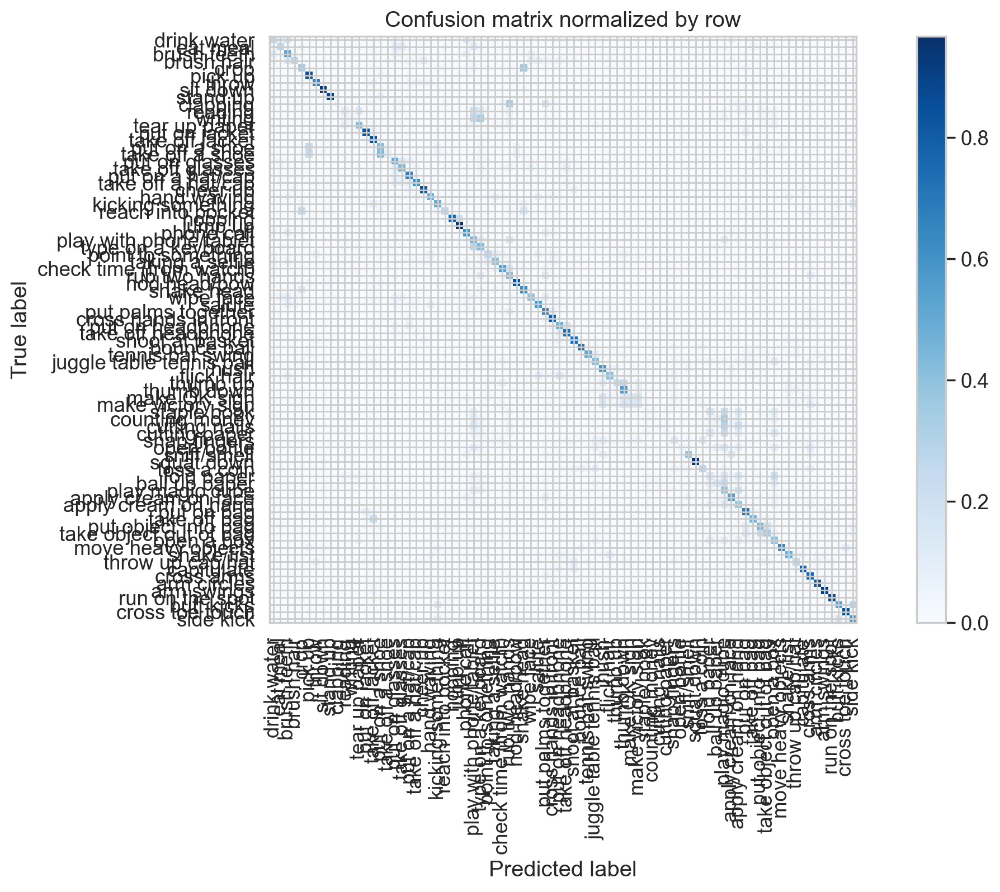

Overall accuracy: 0.481

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.209      0.430      0.282      0.013         93|	 play with phone/tablet: 0.269,	open a box: 0.043,	
       reach into pocket       0.585      0.258      0.358      0.013         93|	 drop: 0.247,	shake head: 0.140,	
           put on a shoe       0.358      0.413      0.384      0.013         92|	 pick up: 0.239,	put object into bag: 0.054,	
              cross arms       0.435      0.761      0.553      0.013         92|	 put palms together: 0.054,	put object into bag: 0.033,	
          put on glasses       0.377      0.505      0.432      0.013         91|	 take off glasses: 0.143,	put on a hat/cap: 0.066,	
           ball up paper       0.271      0.143      0.187      0.013         91|	 play magic cube: 0.253,	open a box: 0.110,	
       kicking something       0.506      0.484      0.494      0.013         91|	 side kick: 0.1

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.492



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.487



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.497



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.494



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.488



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.498



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.491



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.492



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.486



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

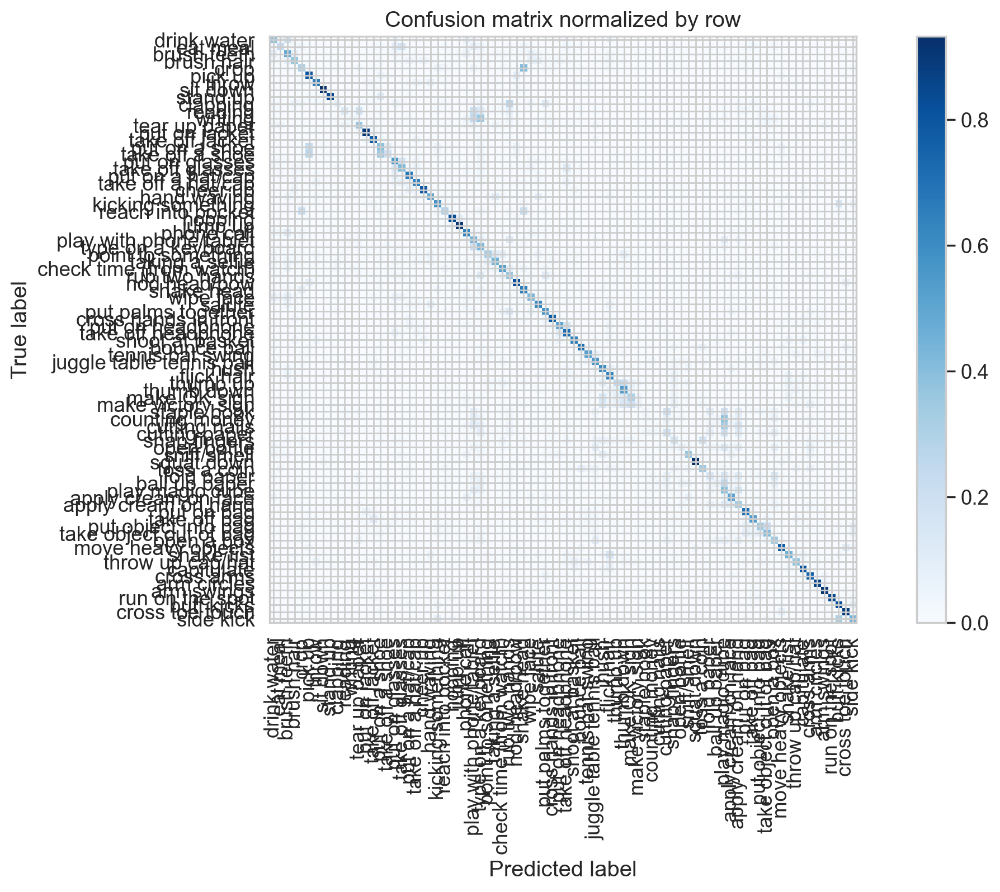

Overall accuracy: 0.497

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.181      0.419      0.253      0.013         93|	 play with phone/tablet: 0.194,	tear up paper: 0.032,	
       reach into pocket       0.553      0.280      0.371      0.013         93|	 drop: 0.215,	shake head: 0.204,	
           put on a shoe       0.324      0.391      0.355      0.013         92|	 pick up: 0.239,	take off a shoe: 0.098,	
              cross arms       0.566      0.750      0.645      0.013         92|	 put palms together: 0.054,	arm swings: 0.033,	
          put on glasses       0.378      0.560      0.451      0.013         91|	 take off glasses: 0.165,	take off a hat/cap: 0.044,	
           ball up paper       0.241      0.077      0.117      0.013         91|	 play magic cube: 0.253,	open a box: 0.088,	type on a keyboard: 0.077,	
       kicking something       0.553      0.571      0.562      0.013         

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.487



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.494



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.497



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.498



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.490



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.497



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.472



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.485



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

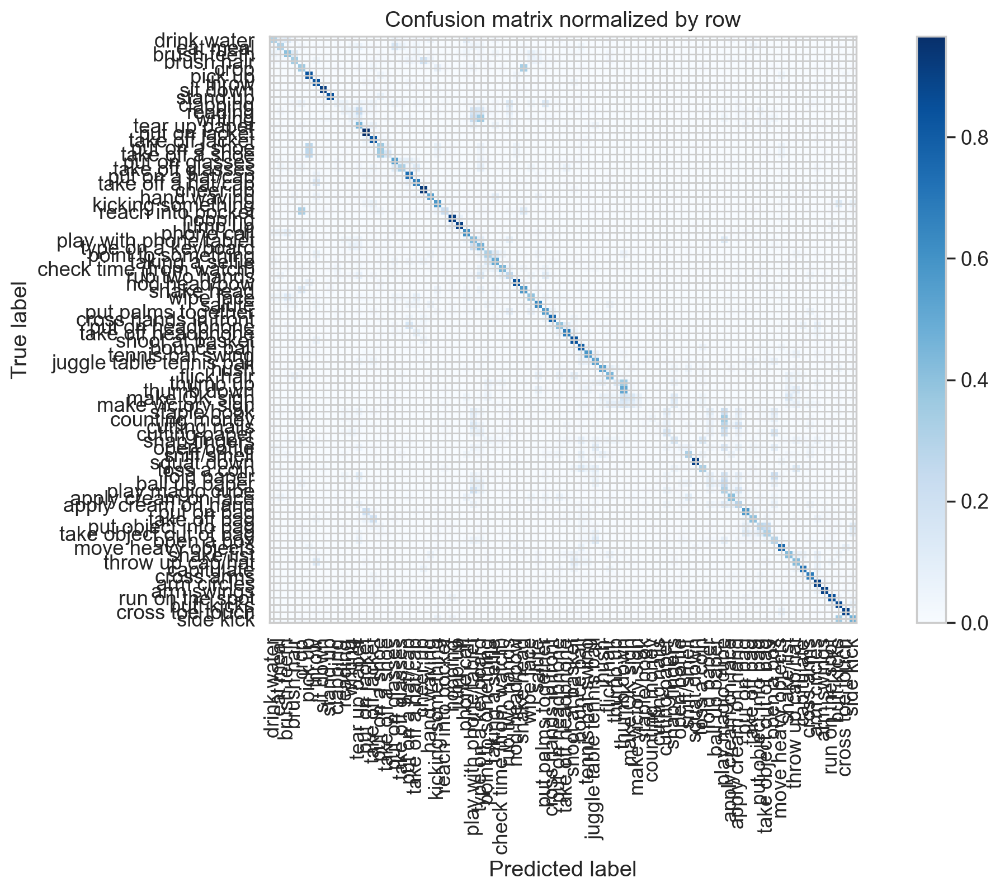

Overall accuracy: 0.482

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.202      0.462      0.281      0.013         93|	 play with phone/tablet: 0.194,	writing: 0.065,	
       reach into pocket       0.636      0.226      0.333      0.013         93|	 drop: 0.323,	shake head: 0.118,	
           put on a shoe       0.324      0.359      0.340      0.013         92|	 pick up: 0.272,	kicking something: 0.065,	
              cross arms       0.636      0.685      0.660      0.013         92|	 take off jacket: 0.033,	put object into bag: 0.033,	
          put on glasses       0.438      0.538      0.483      0.013         91|	 take off glasses: 0.088,	put on a hat/cap: 0.088,	
           ball up paper       0.455      0.055      0.098      0.013         91|	 play magic cube: 0.242,	fold paper: 0.088,	open a box: 0.077,	
       kicking something       0.547      0.571      0.559      0.013         91|	 but

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.495



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.495



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.492



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.477



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.504



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.494



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

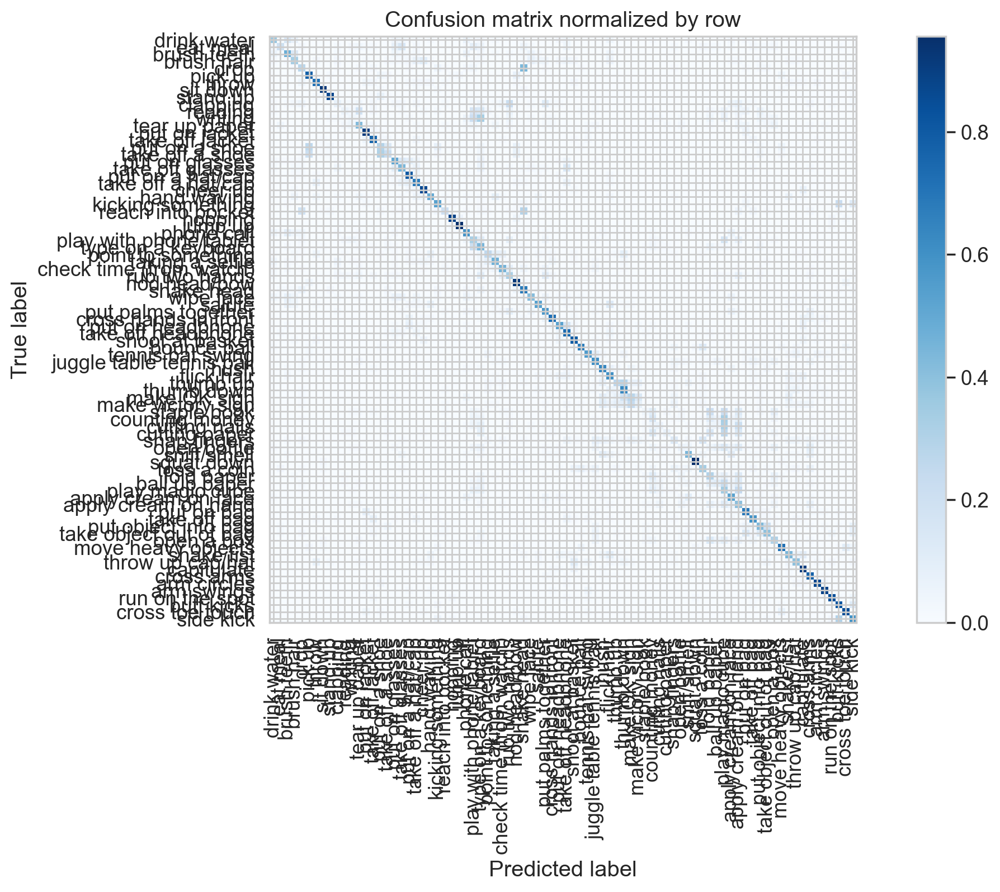

Overall accuracy: 0.505

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.199      0.441      0.274      0.013         93|	 play with phone/tablet: 0.215,	fold paper: 0.043,	
       reach into pocket       0.528      0.204      0.295      0.013         93|	 shake head: 0.290,	drop: 0.183,	
           put on a shoe       0.355      0.293      0.321      0.013         92|	 pick up: 0.261,	take off a shoe: 0.141,	
              cross arms       0.530      0.772      0.628      0.013         92|	 apply cream on hand: 0.033,	put palms together: 0.022,	
          put on glasses       0.465      0.505      0.484      0.013         91|	 take off glasses: 0.132,	put on a hat/cap: 0.088,	
           ball up paper       0.208      0.110      0.144      0.013         91|	 play magic cube: 0.231,	apply cream on hand: 0.121,	
       kicking something       0.608      0.527      0.565      0.013         91|	 butt kick

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.510



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.489



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.500



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.493



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.489



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.486



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.486



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.503



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.505



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

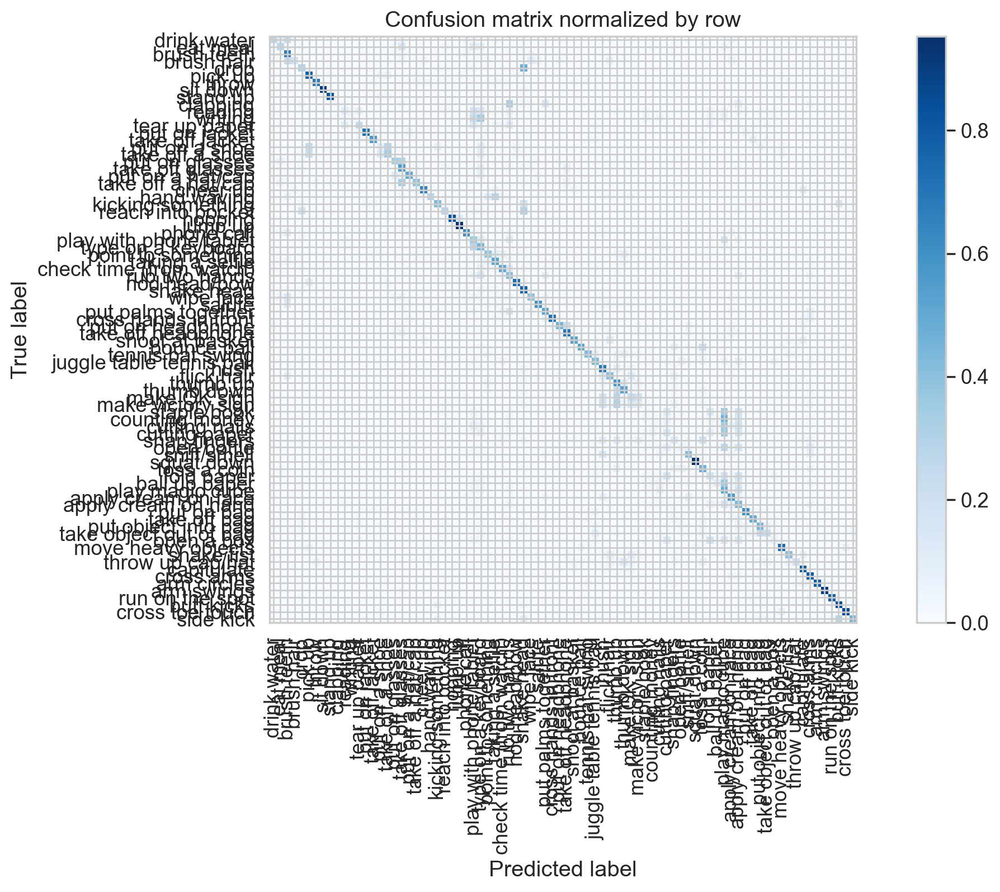

Overall accuracy: 0.462

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.164      0.441      0.239      0.013         93|	 play with phone/tablet: 0.269,	play magic cube: 0.043,	
       reach into pocket       0.391      0.269      0.318      0.013         93|	 shake head: 0.301,	drop: 0.183,	
           put on a shoe       0.281      0.098      0.145      0.013         92|	 take off a shoe: 0.283,	pick up: 0.239,	type on a keyboard: 0.109,	
              cross arms       0.468      0.783      0.585      0.013         92|	 apply cream on hand: 0.043,	apply cream on face: 0.043,	
          put on glasses       0.470      0.341      0.395      0.013         91|	 take off glasses: 0.297,	eat meal: 0.066,	
           ball up paper       0.333      0.099      0.153      0.013         91|	 play magic cube: 0.363,	apply cream on hand: 0.121,	
       kicking something       0.623      0.418      0.500      0.0

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.506



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.497



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.485



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.487



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.506



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.470



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.492



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.491



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

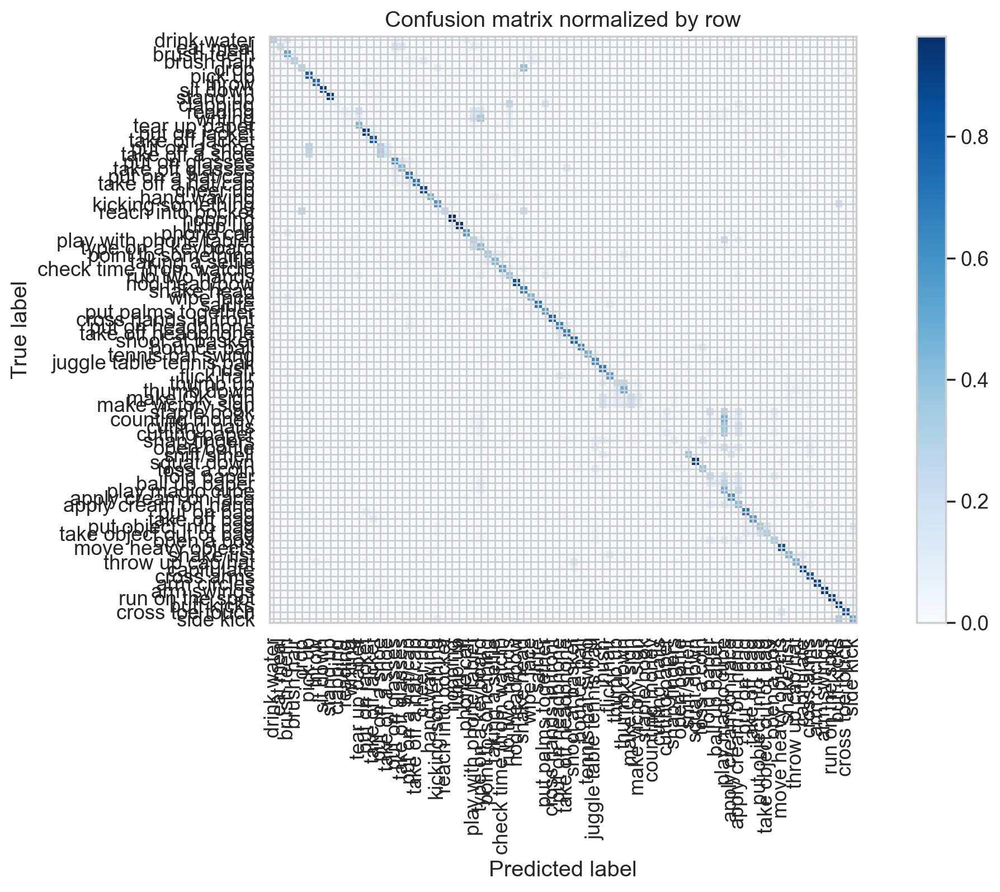

Overall accuracy: 0.507

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.191      0.419      0.263      0.013         93|	 play with phone/tablet: 0.215,	play magic cube: 0.043,	
       reach into pocket       0.522      0.258      0.345      0.013         93|	 drop: 0.269,	shake head: 0.215,	
           put on a shoe       0.330      0.326      0.328      0.013         92|	 pick up: 0.283,	take off a shoe: 0.098,	
              cross arms       0.475      0.815      0.600      0.013         92|	 put palms together: 0.022,	apply cream on face: 0.022,	
          put on glasses       0.404      0.604      0.485      0.013         91|	 take off glasses: 0.110,	put on a hat/cap: 0.066,	
           ball up paper       0.194      0.077      0.110      0.013         91|	 play magic cube: 0.286,	apply cream on hand: 0.132,	fold paper: 0.110,	
       kicking something       0.491      0.571      0.528      0.01

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.477



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.511



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.463



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.505



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.498



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.472



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.476



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.500



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.500



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

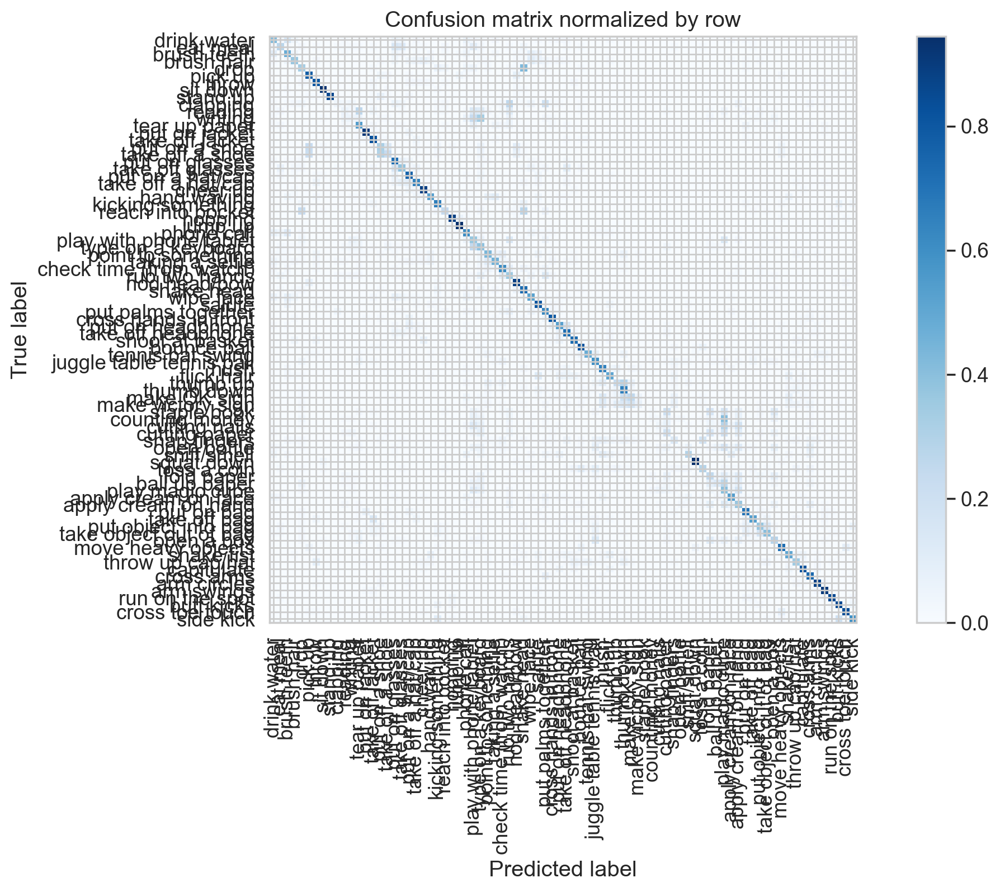

Overall accuracy: 0.518

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.190      0.387      0.255      0.013         93|	 play with phone/tablet: 0.247,	take off a shoe: 0.032,	
       reach into pocket       0.458      0.237      0.312      0.013         93|	 shake head: 0.269,	drop: 0.226,	
           put on a shoe       0.341      0.315      0.328      0.013         92|	 pick up: 0.228,	take off a shoe: 0.130,	
              cross arms       0.596      0.739      0.660      0.013         92|	 put palms together: 0.076,	hush: 0.022,	
          put on glasses       0.448      0.714      0.551      0.013         91|	 take off glasses: 0.066,	put on a hat/cap: 0.033,	
           ball up paper       0.343      0.132      0.190      0.013         91|	 play magic cube: 0.264,	apply cream on hand: 0.088,	
       kicking something       0.583      0.659      0.619      0.013         91|	 butt kicks: 0.066,	

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.476



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.503



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.510



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.507



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.497



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.505



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.498



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.493



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.477



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

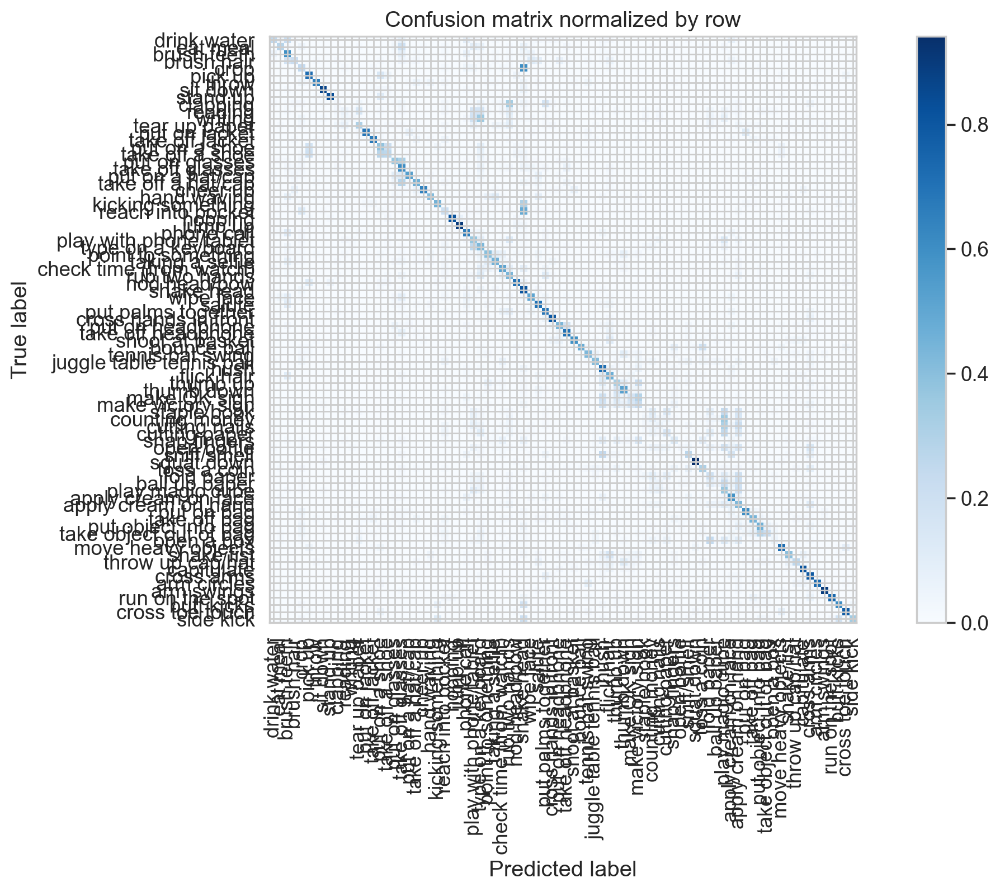

Overall accuracy: 0.461

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.174      0.430      0.248      0.013         93|	 play with phone/tablet: 0.247,	play magic cube: 0.054,	
       reach into pocket       0.229      0.204      0.216      0.013         93|	 shake head: 0.484,	drop: 0.129,	
           put on a shoe       0.318      0.380      0.347      0.013         92|	 take off a shoe: 0.207,	pick up: 0.174,	
              cross arms       0.408      0.793      0.539      0.013         92|	 put palms together: 0.076,	type on a keyboard: 0.022,	
          put on glasses       0.459      0.374      0.412      0.013         91|	 take off glasses: 0.319,	type on a keyboard: 0.044,	
           ball up paper       0.179      0.055      0.084      0.013         91|	 play magic cube: 0.231,	apply cream on hand: 0.198,	fold paper: 0.099,	
       kicking something       0.641      0.451      0.529      0.0

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.505



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.495



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.495



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.496



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.488



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.499



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.491



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.511



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

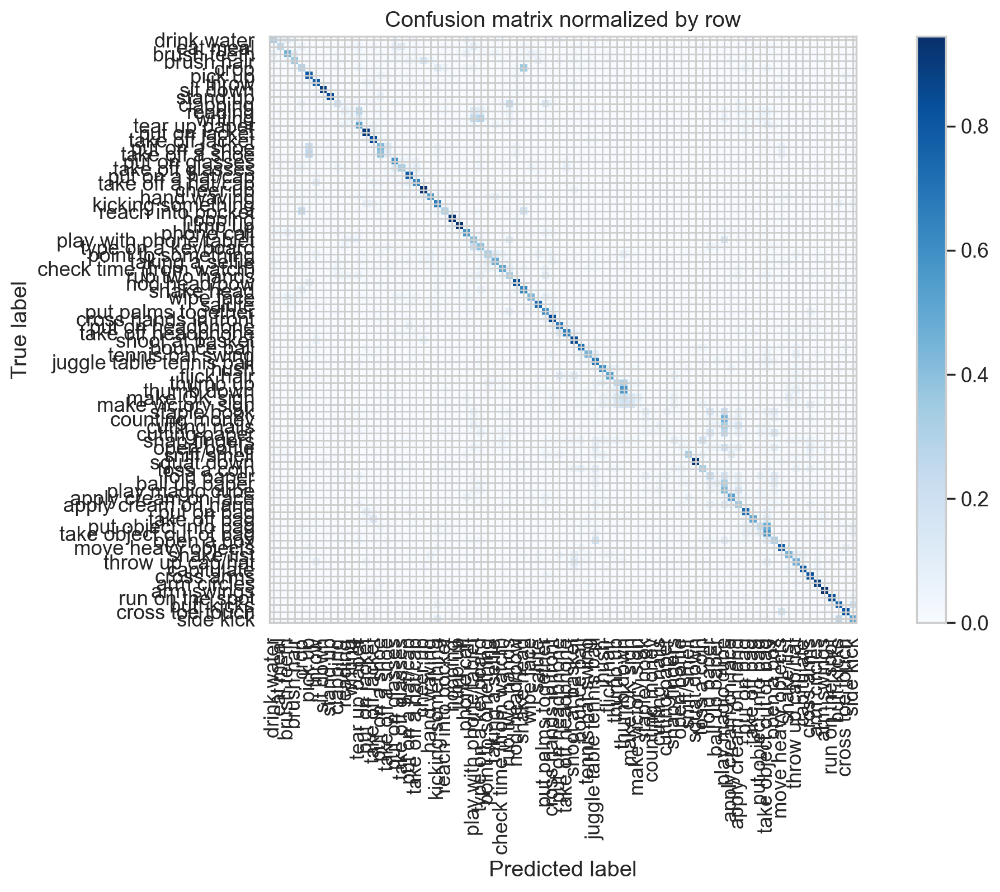

Overall accuracy: 0.506

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.263      0.387      0.313      0.013         93|	 play with phone/tablet: 0.204,	fold paper: 0.054,	
       reach into pocket       0.574      0.290      0.386      0.013         93|	 drop: 0.237,	shake head: 0.183,	
           put on a shoe       0.361      0.424      0.390      0.013         92|	 pick up: 0.217,	take off a shoe: 0.120,	
              cross arms       0.559      0.826      0.667      0.013         92|	 put palms together: 0.033,	take object out of bag: 0.022,	
          put on glasses       0.520      0.582      0.549      0.013         91|	 take off a hat/cap: 0.055,	take off glasses: 0.044,	
           ball up paper       0.241      0.077      0.117      0.013         91|	 play magic cube: 0.319,	open a box: 0.110,	apply cream on hand: 0.077,	
       kicking something       0.500      0.648      0.565      0.01

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.487



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.446



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.500



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.505



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.514



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.511



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.509



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.457



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.497



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

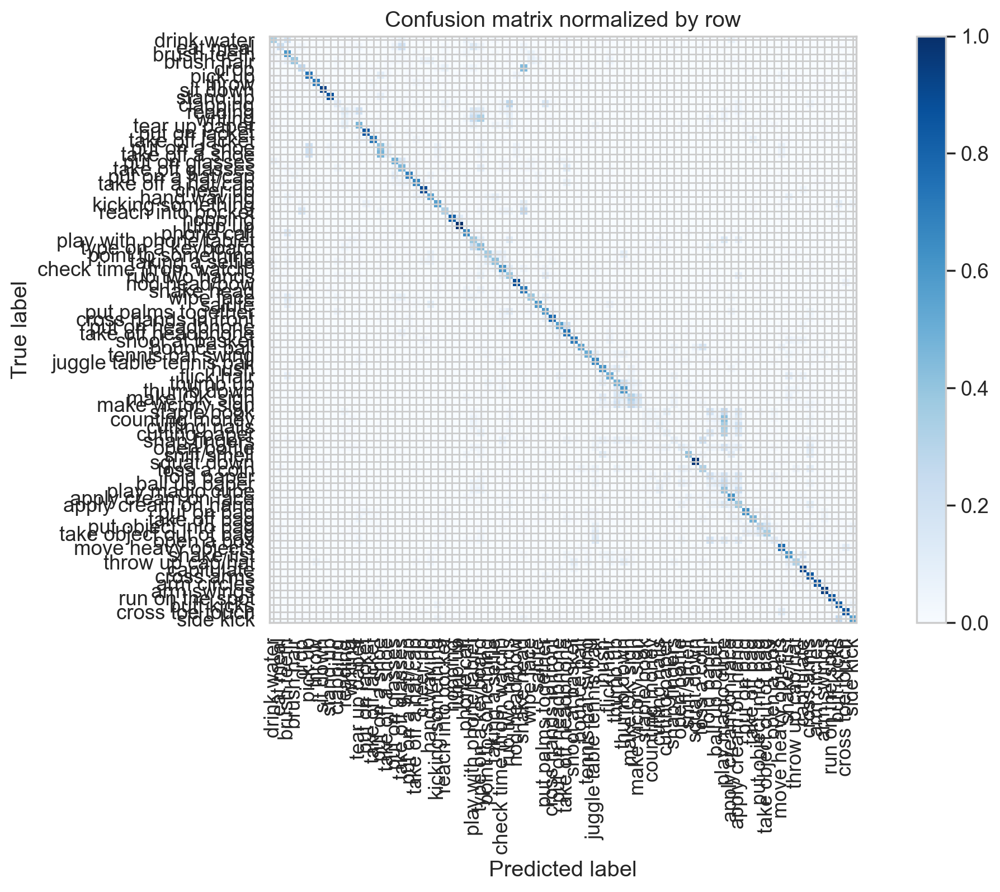

Overall accuracy: 0.509

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.209      0.430      0.282      0.013         93|	 play with phone/tablet: 0.215,	fold paper: 0.054,	
       reach into pocket       0.448      0.323      0.375      0.013         93|	 shake head: 0.247,	drop: 0.161,	
           put on a shoe       0.317      0.413      0.358      0.013         92|	 pick up: 0.207,	take off a shoe: 0.065,	
              cross arms       0.479      0.848      0.612      0.013         92|	 put palms together: 0.033,	apply cream on face: 0.022,	
          put on glasses       0.506      0.484      0.494      0.013         91|	 take off glasses: 0.154,	drink water: 0.066,	
           ball up paper       0.205      0.099      0.133      0.013         91|	 play magic cube: 0.231,	apply cream on hand: 0.099,	
       kicking something       0.662      0.560      0.607      0.013         91|	 shake head: 0.

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.512



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.509



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.506



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.486



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.505



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.486



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.503



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

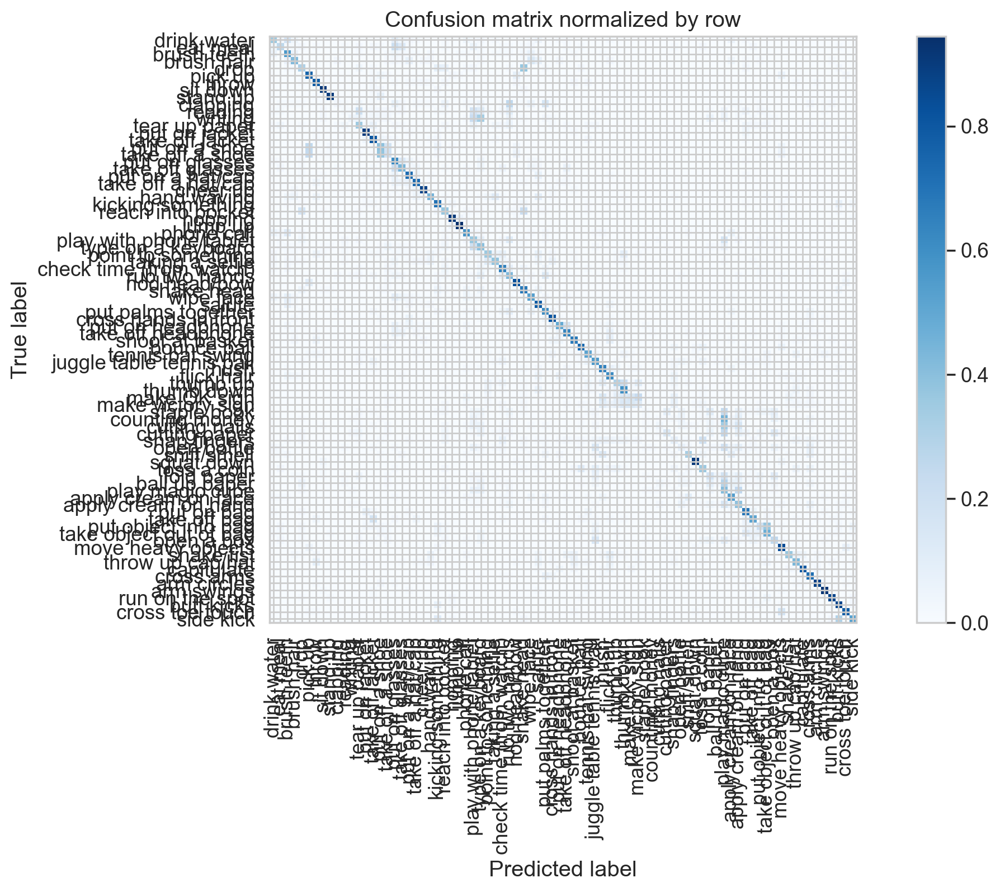

Overall accuracy: 0.507

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.218      0.398      0.281      0.013         93|	 play with phone/tablet: 0.194,	play magic cube: 0.054,	
       reach into pocket       0.362      0.366      0.364      0.013         93|	 shake head: 0.215,	drop: 0.161,	
           put on a shoe       0.333      0.391      0.360      0.013         92|	 pick up: 0.250,	take off a shoe: 0.174,	
              cross arms       0.555      0.717      0.626      0.013         92|	 put palms together: 0.065,	cross hands in front: 0.033,	
          put on glasses       0.329      0.615      0.429      0.013         91|	 take off glasses: 0.132,	type on a keyboard: 0.044,	
           ball up paper       0.143      0.022      0.038      0.013         91|	 play magic cube: 0.286,	fold paper: 0.088,	apply cream on hand: 0.066,	
       kicking something       0.516      0.703      0.595      0

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.515



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.477



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.508



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.501



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.508



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.506



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.475



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.489



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.477



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

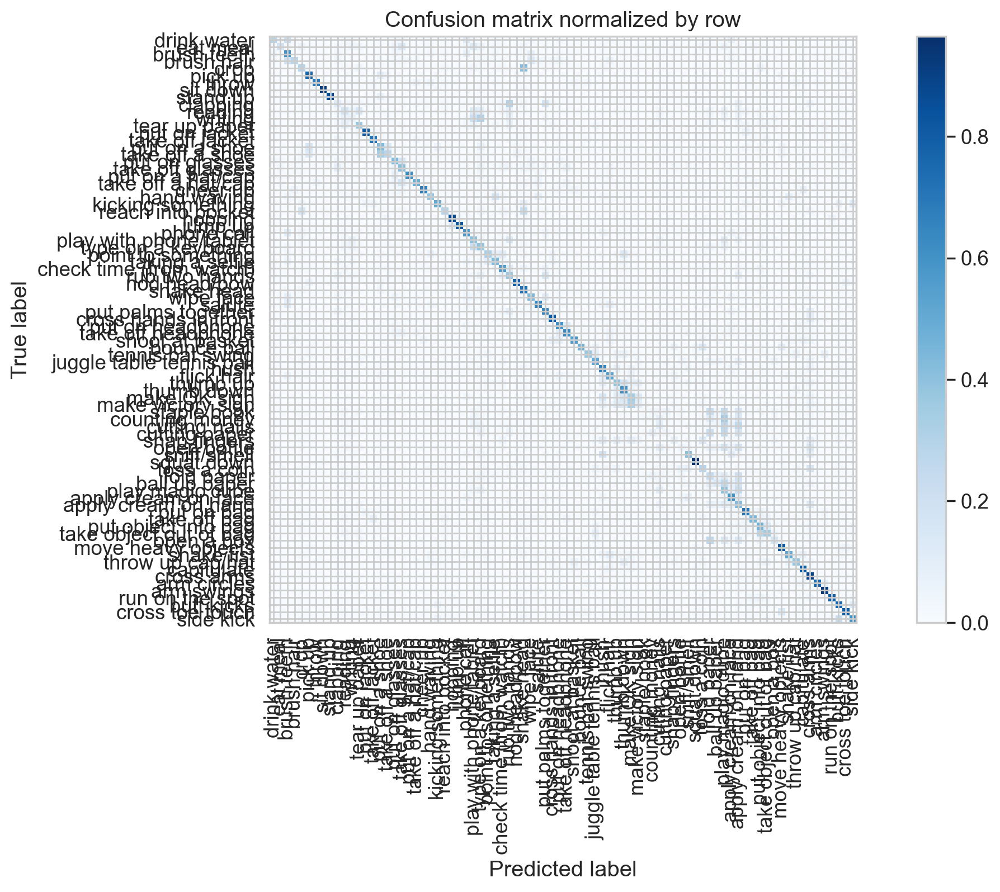

Overall accuracy: 0.487

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.214      0.387      0.276      0.013         93|	 play with phone/tablet: 0.226,	play magic cube: 0.054,	
       reach into pocket       0.574      0.290      0.386      0.013         93|	 shake head: 0.237,	drop: 0.172,	
           put on a shoe       0.402      0.424      0.413      0.013         92|	 pick up: 0.163,	take off a shoe: 0.130,	
              cross arms       0.355      0.891      0.508      0.013         92|	 apply cream on face: 0.022,	apply cream on hand: 0.022,	
          put on glasses       0.470      0.429      0.448      0.013         91|	 take off glasses: 0.165,	wipe face: 0.044,	
           ball up paper       0.265      0.143      0.186      0.013         91|	 play magic cube: 0.253,	apply cream on hand: 0.176,	
       kicking something       0.692      0.495      0.577      0.013         91|	 side kick:

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.474



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.510



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.503



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.504



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.509



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.497



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.441



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.497



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.496



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

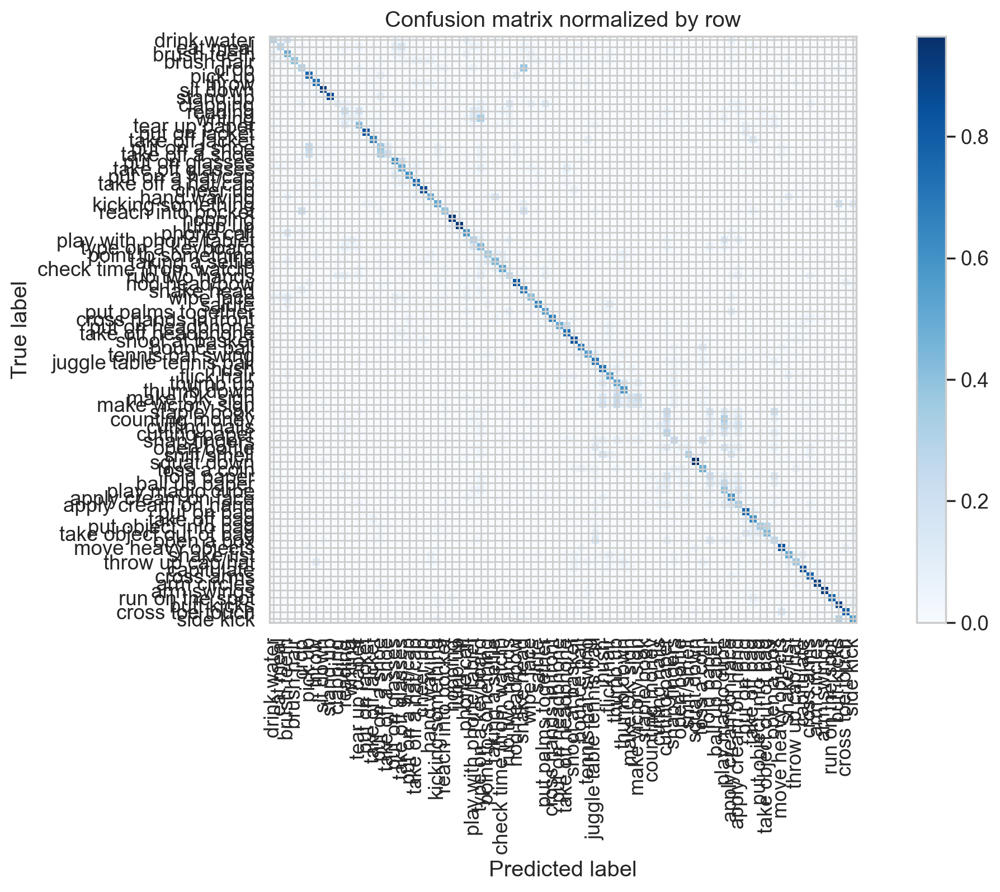

Overall accuracy: 0.514

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.201      0.430      0.274      0.013         93|	 play with phone/tablet: 0.118,	reading: 0.065,	
       reach into pocket       0.500      0.387      0.436      0.013         93|	 drop: 0.204,	shake head: 0.161,	
           put on a shoe       0.324      0.370      0.345      0.013         92|	 pick up: 0.239,	take off a shoe: 0.098,	
              cross arms       0.634      0.772      0.696      0.013         92|	 apply cream on face: 0.033,	put palms together: 0.022,	
          put on glasses       0.510      0.582      0.544      0.013         91|	 take off glasses: 0.176,	take off a hat/cap: 0.033,	
           ball up paper       0.500      0.055      0.099      0.013         91|	 play magic cube: 0.242,	fold paper: 0.121,	cutting paper: 0.099,	
       kicking something       0.562      0.495      0.526      0.013         91

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.518



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.480



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.470



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.468



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.493



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.484



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.510



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.499



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.511



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

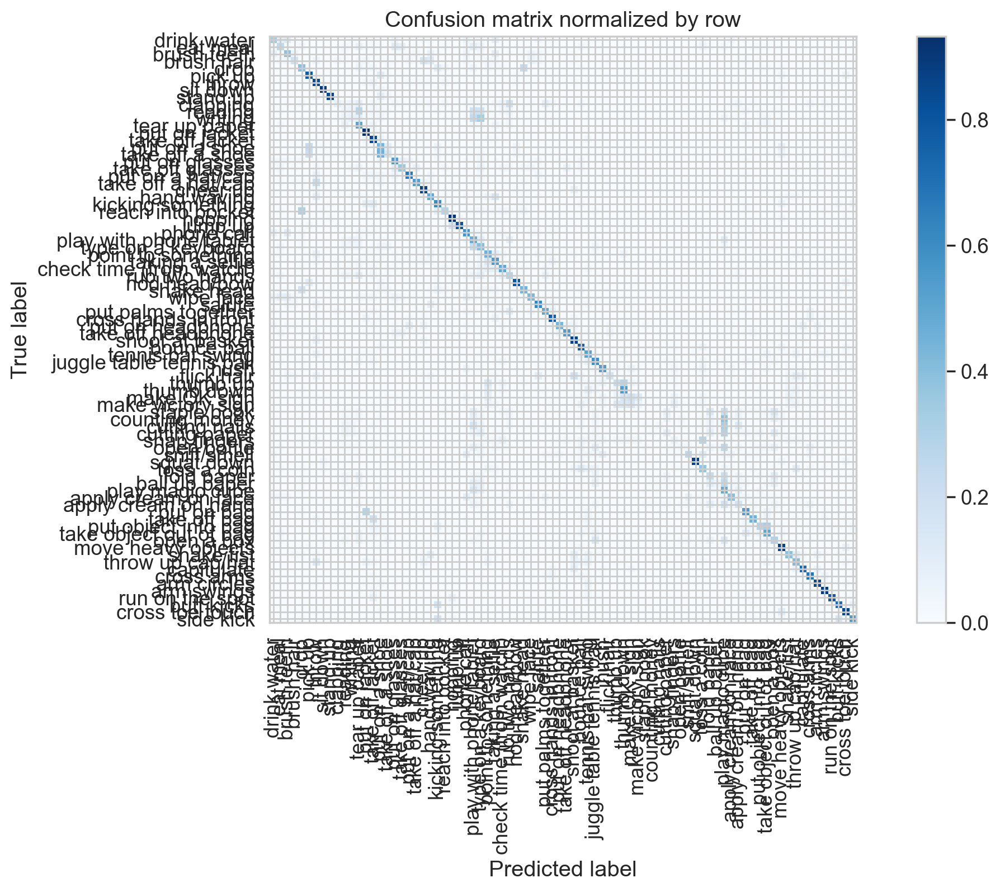

Overall accuracy: 0.475

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.192      0.398      0.259      0.013         93|	 play with phone/tablet: 0.215,	tear up paper: 0.043,	
       reach into pocket       0.565      0.280      0.374      0.013         93|	 drop: 0.301,	kicking something: 0.075,	
           put on a shoe       0.265      0.435      0.329      0.013         92|	 pick up: 0.239,	take off a shoe: 0.098,	
              cross arms       0.643      0.685      0.663      0.013         92|	 arm swings: 0.054,	cross hands in front: 0.043,	
          put on glasses       0.480      0.538      0.508      0.013         91|	 take off glasses: 0.066,	put on a hat/cap: 0.044,	
           ball up paper       0.278      0.055      0.092      0.013         91|	 play magic cube: 0.253,	fold paper: 0.099,	play with phone/tablet: 0.088,	
       kicking something       0.423      0.604      0.498      0.0

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.517



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.519



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.500



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.509



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.446



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.506



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.507



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.449



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.502



train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

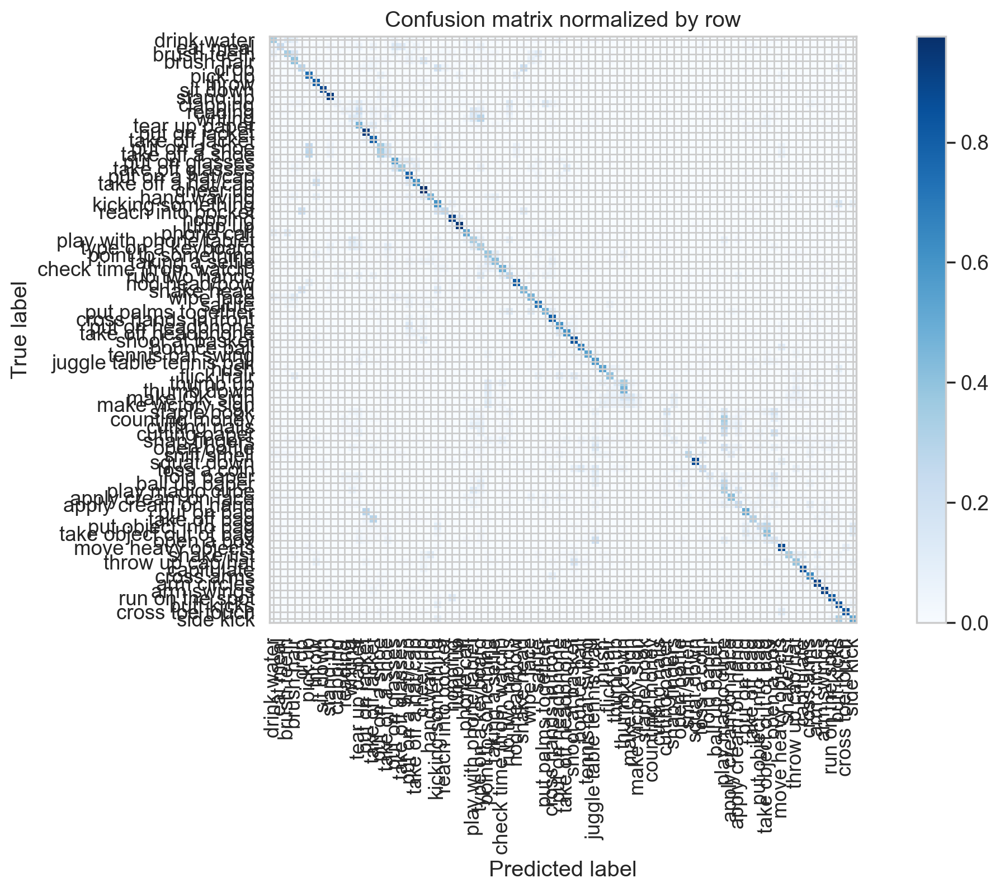

Overall accuracy: 0.470

                           precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

      type on a keyboard       0.179      0.333      0.233      0.013         93|	 writing: 0.097,	play with phone/tablet: 0.086,	
       reach into pocket       0.533      0.258      0.348      0.013         93|	 drop: 0.204,	kicking something: 0.161,	
           put on a shoe       0.282      0.359      0.316      0.013         92|	 pick up: 0.250,	take off a shoe: 0.141,	
              cross arms       0.590      0.641      0.615      0.013         92|	 cross hands in front: 0.087,	arm swings: 0.043,	
          put on glasses       0.414      0.527      0.464      0.013         91|	 put on a hat/cap: 0.099,	take off glasses: 0.077,	
           ball up paper       0.375      0.033      0.061      0.013         91|	 play magic cube: 0.264,	open a box: 0.088,	type on a keyboard: 0.088,	
       kicking something       0.320      0.604      0.418      0.013        

<All keys matched successfully>

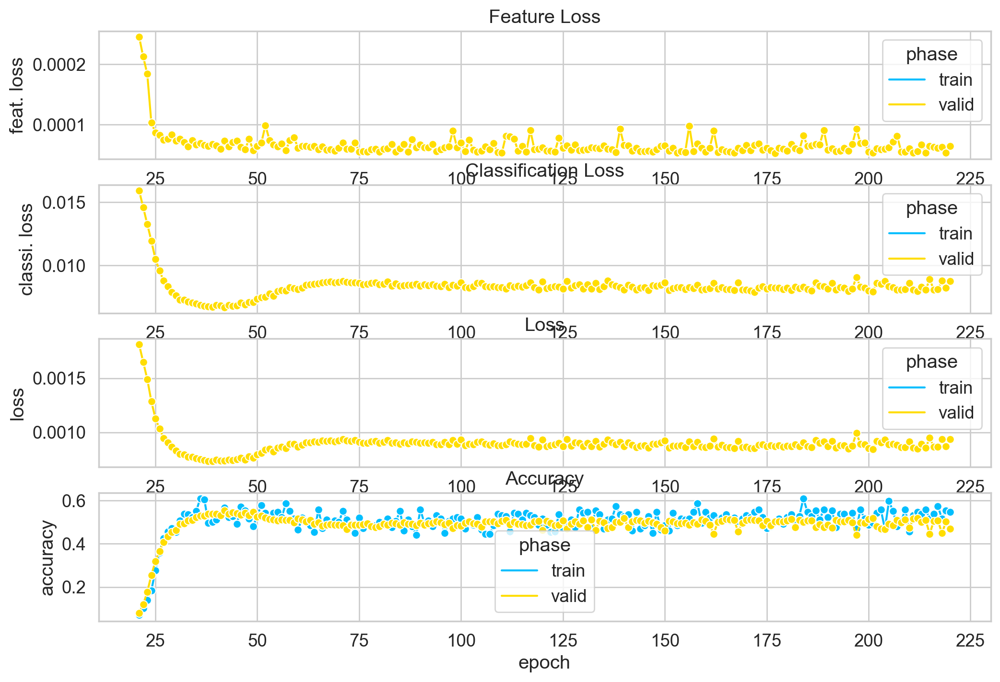

In [27]:
from tqdm.autonotebook import tqdm

best_model_wts = copy.deepcopy(bilstm_model.state_dict())
best_acc = 0.0
show_interval = 10

train_data = []
for epoch in tqdm(range(start_epoch+1, start_epoch+config["n_epochs"] + 1), desc='Training Epoch', leave=False):
  
  train_metrics = train_step(bilstm_model, train_dl, optimizer, std_loss, device, class_names)
  train_metrics['epoch'] = epoch
  train_metrics['phase'] = 'train'
  train_data.append(train_metrics)
  log(epoch, 'train', train_metrics)
  
  if epoch % 10 == 0:
    eval_metrics = eval_step(bilstm_model, val_dl,std_loss, device, class_names,  print_report=True, show_plot=True)
  else:
    eval_metrics = eval_step(bilstm_model, val_dl,std_loss, device, class_names,  print_report=False, show_plot=False)
  eval_metrics['epoch'] = epoch 
  eval_metrics['phase'] = 'valid'
  train_data.append(eval_metrics)
  log(epoch, 'valid', eval_metrics)

  if epoch%10 == 0:
    save_model(
        bilstm_model, 
        f"temp_{model_ident}", 
        f"{epoch}__{unique_iden}",
         models_saves, 
         config)
    
  if eval_metrics['accuracy'] > best_acc:
    best_model = copy.deepcopy(bilstm_model.state_dict())
  
train_df = pd.DataFrame().from_records(train_data)
plot_curves(train_df)

# replace by best model 
bilstm_model.load_state_dict(best_model)


In [28]:
from tqdm.autonotebook import tqdm

best_model_wts = copy.deepcopy(bilstm_model.state_dict())
best_acc = 0.0
show_interval = 10

train_data = []
for epoch in tqdm(range(start_epoch+1, start_epoch+config["n_epochs"] + 1), desc='Training Epoch', leave=False):
  
  train_metrics = train_step(bilstm_model, train_dl, optimizer, std_loss, device, class_names)
  train_metrics['epoch'] = epoch
  train_metrics['phase'] = 'train'
  train_data.append(train_metrics)
  log(epoch, 'train', train_metrics)
  
  if epoch % 10 == 0:
    eval_metrics = eval_step(bilstm_model, val_dl,std_loss, device, class_names,  print_report=True, show_plot=True)
  else:
    eval_metrics = eval_step(bilstm_model, val_dl,std_loss, device, class_names,  print_report=False, show_plot=False)
  eval_metrics['epoch'] = epoch 
  eval_metrics['phase'] = 'valid'
  train_data.append(eval_metrics)
  log(epoch, 'valid', eval_metrics)

  if epoch%10 == 0:
    save_model(
        bilstm_model, 
        f"temp_{model_ident}", 
        f"{epoch}__{unique_iden}",
         models_saves, 
         config)
    
  if eval_metrics['accuracy'] > best_acc:
    best_model = copy.deepcopy(bilstm_model.state_dict())
  
train_df = pd.DataFrame().from_records(train_data)
plot_curves(train_df)

# replace by best model 
bilstm_model.load_state_dict(best_model)


Training Epoch:   0%|          | 0/200 [00:00<?, ?it/s]

train:   0%|          | 0/258 [00:00<?, ?batch/s]

eval:   0%|          | 0/28 [00:00<?, ?batch/s]

Overall accuracy: 0.476



train:   0%|          | 0/258 [00:00<?, ?batch/s]